<a href="https://colab.research.google.com/github/Mohd6288/DAMLCP_Project/blob/main/06_pix2pix_1_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pix2pix: Image to Image Translation

Dataset preparation & training


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).



Notebook adapted originally from [this tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix), ported to PyTorch integrating changes from [DMLAP](https://github.com/IriniKlz/DMLAP-2024/tree/main/python/06-GANs-pix2pix).

See also [the original repo](https://github.com/phillipi/pix2pix) – in Lua – and the 'official' [PyTorch port](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/tree/master) as well as the [paper](https://arxiv.org/abs/1611.07004).

In [ ]:
import os
import sys
import glob
import time
import pathlib

import numpy as np
import matplotlib.pyplot as plt

import cv2
from skimage import filters
from skimage import feature
from skimage import transform

import torch
from torch import nn
import torch.nn.functional as F

import torchvision as tv
from torchvision.transforms import v2
import torchvision.transforms.functional as TF

# Get cpu, gpu or mps device for training
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

# ------------------------------------------------------------------------------
# for dataset processing below
from multiprocessing import Pool
from multiprocessing import Lock
from multiprocessing import cpu_count
from multiprocessing import set_start_method

# make sure we are forking (hacky, for M1/2/3)
if device == "mps":
    set_start_method("fork")

print(f"Multiprocessing: found {cpu_count()} CPUs")
# ------------------------------------------------------------------------------

Using cuda device
Multiprocessing: found 2 CPUs


In [ ]:
BATCH_SIZE = 1
IMG_SIZE = 256
IMG_CHANNELS = 3
IMG_EXTENSION = ".png" # check directory and change to e.g. jpg instead!

# fixed directory structure ----------------------------------------------------
DATASETS_DIR = pathlib.Path("datasets")
DATASETS_DIR.mkdir(exist_ok=True)

MODELS_DIR = pathlib.Path("models")
MODELS_DIR.mkdir(exist_ok=True)

GENERATED_DIR = pathlib.Path("generated")
GENERATED_DIR.mkdir(exist_ok=True)
# ------------------------------------------------------------------------------

## Datasets: Download and Preparation

### Choose a Pix2pix Dataset

**Original datasets**

- cityscapes.tar.gz
- edges2handbags.tar.gz
- edges2shoes.tar.gz
- facades.tar.gz
- maps.tar.gz
- night2day.tar.gz

Available [here](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/). Locally, right click on a link, 'copy link'. Beware the sizes! Some of them are pretty big. For Colab, see **Web download** below.

**Kaggle**

- [Comic faces](https://www.kaggle.com/datasets/defileroff/comic-faces-paired-synthetic): `defileroff/comic-faces-paired-synthetic`
- [Rembrandt](https://www.kaggle.com/datasets/grafstor/rembrandt-pix2pix-dataset): `grafstor/rembrandt-pix2pix-dataset`
- [Depth](https://www.kaggle.com/datasets/greg115/pix2pix-depth): `greg115/pix2pix-depth`
-  [Maps](https://www.kaggle.com/datasets/alincijov/pix2pix-maps) (`alincijov/pix2pix-maps`) (looks identical to `maps` above)

There might be more! Also, if you want to use the transformation pipeline below, any image dataset would work!


### Directory structure

Our goal is to create either one of the two directory structures.

Either images inside our pix2pix directly:

```bash
datasets
└── pix2pix_dataset_name
    ├── 1.jpg
    ...
    └── 1198.jpg
```

Or the same, but with `train`, `test` or `val` sub-directories:

```bash
datasets
└── pix2pix_dataset_name
    ├── train
    │   ├── 1.jpg
    │   ├── 2.jpg
    ...
    ├── test
    ...
```

**Working with transformations**


However, if we apply transformations to the dataset we download (like turning source images black and white), then we might want to keep the downloaded dataset under another name, so that our final, ready dataset is still `pix2pix_dataset_name`, for instance:

```bash
datasets
├── pix2pix_dataset_name
└── pix2pix_dataset_name_orig
```

**Datasets with source and target directories**

For the comics faces dataset, for instance, the sources (pictures) and targets (comics) are in two separate subfolders, we will have to take that into account.

```bash
datasets
├── pix2pix_dataset_name
└── pix2pix_dataset_name_orig
    ├── source
    │   ├── 100.jpg
    ...
    ├── target
    ...
```


### Note on Colab workflow



I recommend working in the same way as with the DCGAN:

1. Either find a reliable url you can download a zip from, and use `wget` directly in the notebook, followed by:  

    ```bash
    unzip -q downloaded-file.zip -d <target-dir>
    ```
    or:
    ```
    tar xzf downloaded-file.tar.gz -C <target-dir>
    ```

    
2. Or download the dataset locally first, then upload it to your drive, change the accessibility settings for the zip file in the drive, copy the `ID` and use `gdown` with the `ID`.

To save generated images and model checkpoints to your drive, it's best to connect to your drive *after* downloading the dataset.

```python
# reminder: Colab code to mount your drive
if 'google.colab' in sys.modules:
    from google.colab import drive
    drive.mount('/content/drive/')
    # Then you can access its contents, with '/drive/MyDrive' as the default for Google Drives
```

After that, you can `cp` and `mv` files to and from your drive as if they were on the local machine.

### Web download


Perhaps the easiest way to get the dataset is to use Unix tools:

```python
# download to datasets dir
!wget http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz -P {DATASETS_DIR}

# uncompress (still in datasets dir)
!tar xzf {DATASETS_DIR}/facades.tar.gz -C {DATASETS_DIR}

# rename to the uncompressed dir to right format: pix2pix_{name}
# remember: our goal is to have either just the pictures in
# `pix2pix_{MODEL_NAME}, or folders like `train`/`test`/`val`
!mv {DATASETS_DIR}/facades {DATASETS_DIR}/pix2pix_facades

# clean-up, !rm -r for directories
# !rm {DATASETS_DIR}/facades.tar.gz
```


In [ ]:
# web download code here


Below, our **global variables** will be:

```python
MODEL_NAME = "facades" # change accordingly (e.g. facades, bw2comics, etc.)

# source and processed datasets
PIX2PIX_DS_DIR_ORIG = DATASETS_DIR / f"pix2pix_{MODEL_NAME}_orig"
# no need to create the dir now, it will be later

PIX2PIX_DS_DIR = DATASETS_DIR / f"pix2pix_{MODEL_NAME}"
# no need to create it now, it will be later

PIX2PIX_DIR = MODELS_DIR / f"pix2pix_{MODEL_NAME}"
PIX2PIX_DIR.mkdir(exist_ok=True)

PIX2PIX_GEN_DIR = GENERATED_DIR / f"pix2pix_{MODEL_NAME}_images"
PIX2PIX_GEN_DIR.mkdir(exist_ok=True)

# Check when plotting or open an image manually!
# 0: [target, source]
# 1: [source, target]
TARGET_INDEX = 0
```

You can use the `global variables code` code cell below for this.

### Kaggle download

To download a dataset from Kaggle, follow these steps:

1. Create a Kaggle account (free)
2. Go to [settings](https://www.kaggle.com/settings), create a token (`.json` file), download it locally and upload it to the main Colab folder (locally, you can just download the dataset manually). You can also save this file to your drive, and copy it from there like so:

```python
from google.colab import drive
drive.mount('/content/drive')
# copy file from drive
!cp "drive/MyDrive/IS53024B-Artificial-Intelligence/kaggle.json" .
```
Then  copy to the root of the Colab:
```python
if os.path.isfile("kaggle.json"):
    print("Found token file `kaggle.json`")
    !mkdir -p /root/.config/kaggle
    !cp kaggle.json /root/.config/kaggle
    !chmod 600 /root/.config/kaggle/kaggle.json
else:
    print("Could not token file `kaggle.json`, please see the steps above!")
```

In [ ]:
# kaggle.json copy
if os.path.isfile("kaggle.json"):
    print("Found token file `kaggle.json`")
    !mkdir -p /root/.config/kaggle
    !cp kaggle.json /root/.config/kaggle
    !chmod 600 /root/.config/kaggle/kaggle.json
else:
    print("Could not token file `kaggle.json`, please see the steps above!")

Found token file `kaggle.json`


Then download:
```python
# also: "grafstor/rembrandt-pix2pix-dataset"
ID = pathlib.Path("defileroff/comic-faces-paired-synthetic") # on Kaggle: username/dataset
!kaggle datasets download {ID} -p {DATASETS_DIR}
```

In [ ]:
# kaggle download
ID = pathlib.Path("defileroff/comic-faces-paired-synthetic") # on Kaggle: username/dataset
!kaggle datasets download {ID} -p {DATASETS_DIR}

Dataset URL: https://www.kaggle.com/datasets/defileroff/comic-faces-paired-synthetic
License(s): Attribution 4.0 International (CC BY 4.0)
100% 659M/662M [00:06<00:00, 137MB/s]
100% 662M/662M [00:06<00:00, 114MB/s]


Unzip:
```bash
!unzip -q {DATASETS_DIR}/comic-faces-paired-synthetic.zip -d {DATASETS_DIR}
```

In [ ]:
# unzip
!unzip -q {DATASETS_DIR}/comic-faces-paired-synthetic.zip -d {DATASETS_DIR}

Clean-up:
```bash
# Then retrieve the name & structure, in this case:
# face2comics_v1.0.0_by_Sxela/face2comics_v1.0.0_by_Sxela/
# I want to simplify this, so:
!mv {DATASETS_DIR}/face2comics_v1.0.0_by_Sxela/face2comics_v1.0.0_by_Sxela {DATASETS_DIR}/pix2pix_face2comics_orig

# # clean-up
# !rm -r "{DATASETS_DIR}/face2comics_v1.0.0_by_Sxela"
# !rm "{DATASETS_DIR}/comic-faces-paired-synthetic.zip"
```

In [ ]:
# directory structure and clean-up

Finally, change your **global variables** accordingly

```python
MODEL_NAME = "face2comics" # change accordingly (e.g. edge2comics, etc.)

# source and processed datasets
PIX2PIX_DS_DIR_ORIG = DATASETS_DIR / f"pix2pix_{MODEL_NAME}_orig"
# PIX2PIX_DS_DIR_ORIG.mkdir(exist_ok=True) # already done, uncomment if you need

PIX2PIX_DS_DIR = DATASETS_DIR / f"pix2pix_{MODEL_NAME}"
# PIX2PIX_DS_DIR.mkdir(exist_ok=True) # already done, uncomment if you need

PIX2PIX_DIR = MODELS_DIR / f"pix2pix_{MODEL_NAME}"
PIX2PIX_DIR.mkdir(exist_ok=True)

PIX2PIX_GEN_DIR = GENERATED_DIR / f"pix2pix_{MODEL_NAME}_images"
PIX2PIX_GEN_DIR.mkdir(exist_ok=True)

# 0: [target, source]
# 1: [source, target]
TARGET_INDEX = 0
```

You can use the `global variables code` code cell below for this.

### Setting up our global variables

Each training image in a standard pix2pix dataset consists of one imgage divided into two adjacent **source** and **target** images.
The layout of the source and target may vary from training set to trainig set, so we provide a `TARGET_INDEX` flag the determines on which side the target is (`0` if on the left and `1` if on the right). Set this so the examples from the dataset appear with the source image to the left.

In [ ]:
# global variables code here
MODEL_NAME = "face2comics" # change accordingly (e.g. edge2comics, etc.)

# source and processed datasets
PIX2PIX_DS_DIR_ORIG = DATASETS_DIR / f"pix2pix_{MODEL_NAME}_orig"
# PIX2PIX_DS_DIR_ORIG.mkdir(exist_ok=True) # already done, uncomment if you need

PIX2PIX_DS_DIR = DATASETS_DIR / f"pix2pix_{MODEL_NAME}"
# PIX2PIX_DS_DIR.mkdir(exist_ok=True) # already done, uncomment if you need

PIX2PIX_DIR = MODELS_DIR / f"pix2pix_{MODEL_NAME}"
PIX2PIX_DIR.mkdir(exist_ok=True)

PIX2PIX_GEN_DIR = GENERATED_DIR / f"pix2pix_{MODEL_NAME}_images"
PIX2PIX_GEN_DIR.mkdir(exist_ok=True)

# 0: [target, source]
# 1: [source, target]
TARGET_INDEX = 0

## Working with transformations

**This entire section can be ignored if our dataset is already `pix2pix` formatted (with AB or BA images).**

### More Variables


This section is meant for two scenarios:

1. We have two separate directories with A and B images, they will be:
    - `SOURCE_DIR`
    - `TARGET_DIR`

2. We only want to transform one set of images, and that will be:
    - `TARGET_DIR`
    - (`SOURCE_DIR = None`)

In [ ]:
# True For a standard pix2pix dataset (source/target in one image), False otherwise
IS_INPUT_PIX_TO_PIX = True # True or False

# Only used if we have separate source and target directories,
# e.g. 'datasets/pix2pix_face2comics/face/'
SOURCE_DIR = PIX2PIX_DS_DIR_ORIG / "face"
TARGET_DIR = PIX2PIX_DS_DIR_ORIG / "comics"

### Load the images to process

In [ ]:
def load_image(path):
    w, h = (256, 256)
    if IS_INPUT_PIX_TO_PIX: # In case we are already loading a pix2pix image
        w, h = (512, 256)
    img = cv2.imread(path)
    img = cv2.resize(img, (w,h), interpolation=cv2.INTER_NEAREST)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # OpenCV is BGR by default
    # If we are loading a pix2pix dataset just extract the target
    if IS_INPUT_PIX_TO_PIX:
        if TARGET_INDEX == 0:
            img = img[:,:h,:]
        else:
            img = img[:,h:,:]

    return img

def load_images_in_path(path, shuffle=False, limit=0):
    fnames = glob.glob(os.path.join(path, "*"))
    print(f"Found {len(fnames)} files in '{path}'")
    if limit > 0:
        fnames = fnames[:limit]
        print(f"Limiting number of files to {limit}")
    for f in fnames:
        yield load_image(f) # See this: https://realpython.com/introduction-to-python-generators/

Found 10000 files in 'datasets/pix2pix_face2comics_orig/face'


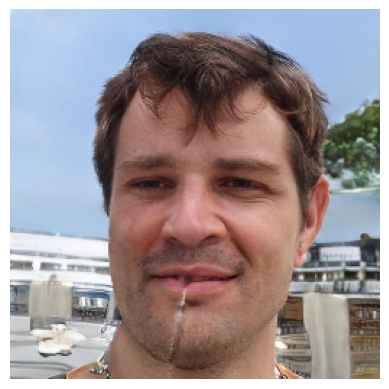

Found 10000 files in 'datasets/pix2pix_face2comics_orig/comics'


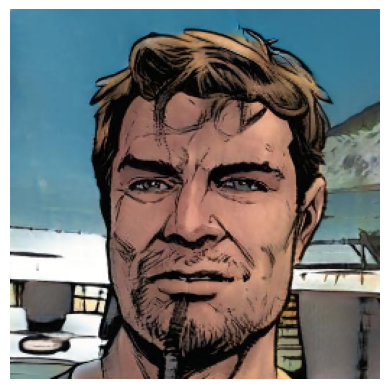

In [ ]:
if SOURCE_DIR:
    source_loader = iter(load_images_in_path(SOURCE_DIR))
    plt.axis("off")
    plt.imshow(next(source_loader))
    plt.show()

target_loader = iter(load_images_in_path(TARGET_DIR)) # create an iterator
plt.axis("off")
plt.imshow(next(target_loader))
plt.show()

### The transformation pipeline



#### Transformation utils

Note: if you plan to use `apply_face_landmarks`, you will need to install mediapipe first!

```bash
!pip install mediapipe
```

In [ ]:
def apply_bw_cv2(img):
    """Turn an image black and white using OpenCV"""
    grey_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return cv2.merge([grey_img, grey_img, grey_img]) # Force three channels for shape compat, thanks ChatGPT!

def apply_canny_cv2(img, thresh1=160, thresh2=250, invert=False):
    """Apply the OpenCV Canny edge detector to an image"""
    grey_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(grey_img, thresh1, thresh2)
    if invert:
        edges = cv2.bitwise_not(edges)
    return cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

def apply_canny_skimage(img, sigma=1.5, invert=False):
    """Apply the Scikit-Image Canny edge detector to an image"""
    grey_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = (feature.canny(grey_img, sigma=sigma)*255).astype(np.uint8)
    if invert:
        edges = cv2.bitwise_not(edges)
    return cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

# IDEA: It might be possible to use other Mediapipe functionalities, like:
#       - segmentation: https://developers.google.com/mediapipe/solutions/vision/image_segmenter
#       - pose landmarks: https://developers.google.com/mediapipe/solutions/vision/pose_landmarker
#       to write other transformation functions... (For both of those, you then need to find datasets!)

def apply_face_landmarks(
        img, stroke_weight=2, overlay=False, overlay_color='black'
    ):
    """Apply the MediaPipe face landmarker to an image"""
    import urllib
    import mediapipe as mp # requires pip install mediapipe
    from mediapipe import solutions
    from mediapipe.framework.formats import landmark_pb2
    from mediapipe.tasks.python import vision
    from mediapipe.tasks.python.core import base_options as base_options_module

    # Path to the model file
    model_path = PIX2PIX_DIR / "face_landmarker.task"

    # Check if the model file exists, if not, download it
    if not model_path.exists():
        url = "https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task"
        print(f"Downloading model from {url}...")
        urllib.request.urlretrieve(url, model_path)
        print(f"Model downloaded and saved as {model_path}")

    # Initialize MediaPipe FaceLandmarker
    base_options = base_options_module.BaseOptions(model_asset_path=model_path)
    options = vision.FaceLandmarkerOptions(
        base_options=base_options,
        output_face_blendshapes=True,
        output_facial_transformation_matrixes=True,
        num_faces=1
    )
    detector = vision.FaceLandmarker.create_from_options(options)

    # Function to draw landmarks on the image
    def draw_landmarks_on_image(rgb_image, detection_result,
                                overlay=False, overlay_color='black'):
        face_landmarks_list = detection_result.face_landmarks

        if overlay:
            annotated_image = np.copy(rgb_image)
        else:
            if overlay_color == "white":
                annotated_image = np.ones_like(rgb_image) * 255
            else: # default to black
                annotated_image = np.zeros_like(rgb_image)

        # Loop through the detected faces to visualize.
        for idx in range(len(face_landmarks_list)):
            face_landmarks = face_landmarks_list[idx]

            # Draw the face landmarks.
            face_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
            face_landmarks_proto.landmark.extend([
                landmark_pb2.NormalizedLandmark(
                    x=landmark.x, y=landmark.y, z=landmark.z
                ) for landmark in face_landmarks
            ])

            solutions.drawing_utils.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks_proto,
                connections=solutions.face_mesh.FACEMESH_TESSELATION,
                landmark_drawing_spec=None,
                connection_drawing_spec=solutions.drawing_styles.get_default_face_mesh_tesselation_style())
            solutions.drawing_utils.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks_proto,
                connections=solutions.face_mesh.FACEMESH_CONTOURS,
                landmark_drawing_spec=None,
                connection_drawing_spec=solutions.drawing_styles.get_default_face_mesh_contours_style())
            solutions.drawing_utils.draw_landmarks(
                image=annotated_image,
                landmark_list=face_landmarks_proto,
                connections=solutions.face_mesh.FACEMESH_IRISES,
                landmark_drawing_spec=None,
                connection_drawing_spec=solutions.drawing_styles.get_default_face_mesh_iris_connections_style())

        return annotated_image

    # Convert the frame to RGB and create MediaPipe Image
    rgb_frame = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb_frame)

    # Detect face landmarks in the frame
    detection_result = detector.detect(mp_image)

    # Annotate frame with detected landmarks
    if detection_result:
        annotated_img = draw_landmarks_on_image(
            img, detection_result, overlay=overlay, overlay_color=overlay_color
    )
    else: # you could also imagine returning a purely black/white image
        annotated_img = img

    return annotated_img

# IDEA: Use Canvas (or openCV) to remove parts of the image (draw a rectangle/circle somewhere)
#       so that the net learns to complete an image with a hole in it (inpainting)

#### Select our transformation

Found 10000 files in 'datasets/pix2pix_face2comics_orig/face'


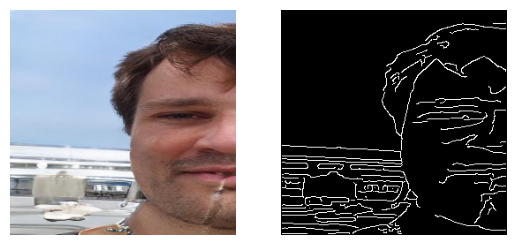

In [ ]:
# As it is, this version loads an image from the source_image directory and
# applies the Canny edge detection algorithm to it.
def load_source(img, img_source_iterator):
    return next(img_source_iterator)

# set to True to apply one of the transforms above
# False will load the next image from SOURCE_DIR as is
USE_TRANSFORM=True

if USE_TRANSFORM:
    # Set this to the tranformation you want to apply. If you are only working with
    # a single folder of images that you want to process, set image_transformation
    # to one of the filtering operations above,
    # e.g.
    # image_transformation = apply_bw_cv2
    # image_transformation = apply_canny_cv2
    image_transformation = apply_canny_skimage
    # image_transformation = apply_face_landmarks
else:
    # If you are working with existing sources, you can use
    # a Python partial to assign a fixed argument to load_source
    # and use it exactly like the other image transformations
    # (See: https://docs.python.org/3/library/functools.html#functools.partial)

    from functools import partial
    image_transformation = partial(
        load_source, img_source_iterator=iter(load_images_in_path(SOURCE_DIR))
    )

# Note that the partial can be used to specify arguments for `apply_face_landmarks`
# from functools import partial
# image_transformation = partial(apply_face_landmarks, overlay_color="white")

img = next(load_images_in_path(SOURCE_DIR))

plt.figure()
plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(image_transformation(img))
plt.show()

#### Create the dataset!

In [ ]:
# !rm datasets/pix2pix_face2comics/*

In [ ]:
MAX_IMAGES = 0     # max images to process, 0: disabled
PRINT_EVERY = 1000 # printing progress

img_loader = iter(load_images_in_path(TARGET_DIR, limit=MAX_IMAGES))

def combine_images(source, target):
    if TARGET_INDEX == 1:
        combined = np.hstack([source, target])
    else:
        combined = np.hstack([target, source])
    return combined

def process_source_target(i, source, target, out_dir):
    """Combine source and target and save them"""
    # IDEA: you could also apply additional processing to either
    # your source or target here
    # target = image_transformation(target)
    source = image_transformation(source)
    combined = combine_images(source, target)
    combined = cv2.cvtColor(combined, cv2.COLOR_RGB2BGR)
    # multiprocessing: only one process at a time
    with lock:
        cv2.imwrite(out_dir / f"{i+1}.png", combined)

def process_target(i, target, out_dir):
    """Process target and save the combine images"""
    source = image_transformation(target)
    combined = combine_images(source, target)
    combined = cv2.cvtColor(combined, cv2.COLOR_RGB2BGR)
    # multiprocessing: only one process at a time
    with lock:
        cv2.imwrite(out_dir / f"{i+1}.png", combined)

# ------------------------------------------------------------------------------
# multiprocessing!

t = time.time()

l = Lock()
def init(l):
    """Initialize a lock to avoid race conditions"""
    global lock
    lock = l

if SOURCE_DIR:
    # CASE 1: we have source images, we want to combine them
    PIX2PIX_DS_DIR.mkdir(exist_ok=True)

    # create a source image iterator
    source_loader = iter(load_images_in_path(SOURCE_DIR, limit=MAX_IMAGES))

    with Pool(processes=cpu_count(), initializer=init, initargs=(l,)) as p:
        for i, (source, target) in enumerate(zip(source_loader, img_loader)):
            if (i+1) % PRINT_EVERY == 0:
                print(f"Processing source #{i+1}")
            p.apply_async(
                process_source_target, args=(i, source, target, PIX2PIX_DS_DIR)
            )
        p.close()
        p.join()

else:
    # CASE 2: we only have targets, we create the sources and combine them
    PIX2PIX_DS_DIR.mkdir(exist_ok=True)

    with Pool(processes=cpu_count(), initializer=init, initargs=(l,)) as p:
        for i, target in enumerate(img_loader):
            if (i+1) % PRINT_EVERY == 0:
                print(f"Processing target #{i+1}")
            p.apply_async(process_target, args=(i, target, PIX2PIX_DS_DIR))
        p.close()
        p.join()

print("Total time:", time.time() - t)
# ------------------------------------------------------------------------------

# verify the number of files in our directory (wc counts words, lines or bytes)
!ls {PIX2PIX_DS_DIR} | wc -l

Found 10000 files in 'datasets/pix2pix_face2comics_orig/face'
Found 10000 files in 'datasets/pix2pix_face2comics_orig/comics'
Processing source #1000
Processing source #2000
Processing source #3000
Processing source #4000
Processing source #5000
Processing source #6000
Processing source #7000
Processing source #8000
Processing source #9000
Processing source #10000
Total time: 148.27388501167297
10000


## Dataset ready: load and preprocess it

The following code also **augments** the dataset by applying random uniform scaling (by upscaling and cropping) and random mirroring to the input output pairs. This should lead to a more stable model according to the original pix2pix paper. Finally the images ar normalized to the [-1,1] range as required by our GAN-based model.

We will organize the dataset in batches of size `1`, as that is generally suggested for pix2pix models. That means that we will update the weights of the model for each image pair separately.



In [ ]:
def random_jitter(input_image, target_image):
    # Resizing to 286x286
    resize_transform = v2.Resize(size=(286, 286), interpolation=v2.InterpolationMode.NEAREST)
    input_image = resize_transform(input_image)
    target_image = resize_transform(target_image)

    # Random cropping back to 256x256
    i, j, h, w = v2.RandomCrop.get_params(input_image, output_size=(256, 256))
    input_image = TF.crop(input_image, i, j, h, w)
    target_image = TF.crop(target_image, i, j, h, w)

    # Random mirroring
    if np.random.uniform() < 0.5:
        input_image = TF.hflip(input_image)
        target_image = TF.hflip(target_image)

    return input_image, target_image

class Pix2PixImageDataset(torch.utils.data.Dataset):
    def __init__(self, path, target_index):
        super(Pix2PixImageDataset, self).__init__()
        self.files = [os.path.join(path, f) for f in os.listdir(path) if '.jpg' in f or '.png' in f]
        self.target_index = target_index

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        path = self.files[idx]
        image = cv2.imread(path)
        if image is None:
            shape = (BATCH_SIZE, IMG_CHANNELS, IMG_SIZE, IMG_SIZE)
            return torch.zeros(shape).to(device), torch.zeros(shape).to(device)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # OpenCV is BGR by default
        image = v2.ToImage()(image)
        image = v2.ToDtype(torch.float32, scale=True)(image) # from [0,255] to [0,1]
        w = image.shape[-1]
        w = w // 2

        if self.target_index == 0:          # 0: [target, source]
            input_image = image[:, :, w:]
            target_image = image[:, :, :w]
        else:                               # 1: [source, target]
            input_image = image[:, :, :w]
            target_image = image[:, :, w:]
        # Jitter
        input_image, target_image = random_jitter(input_image, target_image)
        # Normalize
        input_image = input_image * 2 - 1
        target_image = target_image * 2 - 1
        return input_image.to(device), target_image.to(device)

In [ ]:
split_train_test = True # change accordingly!
# only used if `split_train_test` is False (a split already present)
TRAIN_DIR = "train"
TEST_DIR = "val"

if split_train_test:
    train_data_orig = Pix2PixImageDataset(PIX2PIX_DS_DIR, TARGET_INDEX)

    train_data, test_data = torch.utils.data.random_split(train_data_orig, [.9,.1])
    print(f"Train samples: {len(train_data)} | Test samples: {len(test_data)}")
else:
    train_data = Pix2PixImageDataset(PIX2PIX_DS_DIR / TRAIN_DIR, TARGET_INDEX)
    test_data = Pix2PixImageDataset(PIX2PIX_DS_DIR / TEST_DIR, TARGET_INDEX)

# create data loaders
train_dataloader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Train samples: 9000 | Test samples: 1000


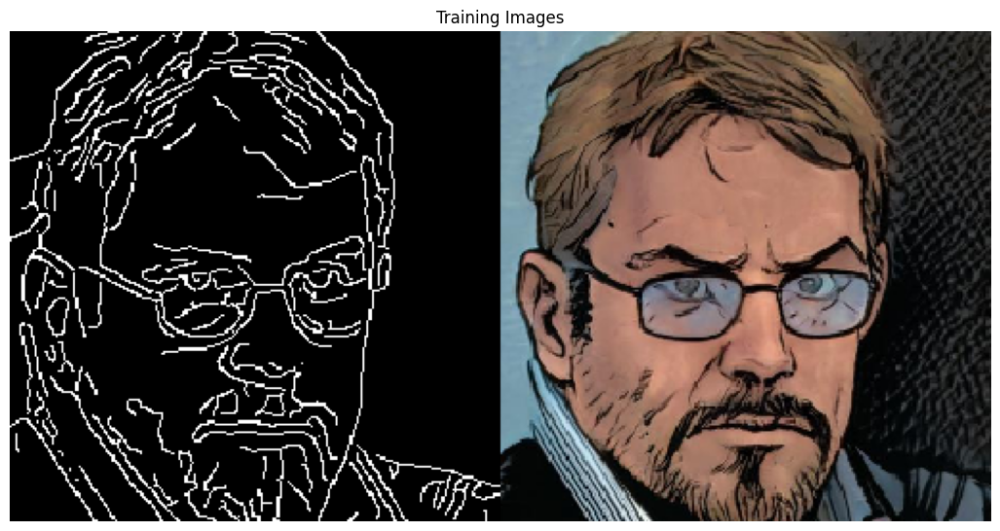

In [ ]:
# get a batch of training images
for i, t in enumerate(train_dataloader):

    x, y = t

    plt.figure(figsize=(13,16))
    plt.axis("off")
    plt.title("Training Images")
    lim = 16
    plt.imshow(TF.to_pil_image(
        tv.utils.make_grid(
            torch.cat([x[:lim], y[:lim]], dim = -1),
            # x[:64],
            padding=2, normalize=True, nrow=4
        ).detach().cpu())
    )
    plt.show()

    break

Note: sometimes you run into errors because of faulty files, etc. One way to test that everything is right in your dataset is to loop over it once, doing nothing:

In [ ]:
for i, (input_image, target_image) in enumerate(train_dataloader):
    continue

## Build  the model



The pix2pix model is a conditional generative adversarial network (cGAN). A cGAN
is a type of GAN model used for generating new data samples with specific
attributes or characteristics. In a cGAN, both the generator and discriminator
are *conditioned* on additional information, such as class labels, tags, or
other types of metadata. The generator network takes in random noise as well as
the conditional information as input and produces a new data sample that matches
the desired attributes. The discriminator network, on the other hand, tries to
distinguish between the generated samples and real samples based on both their
visual appearance and the conditional information. For the case of a pix2pix
model the network is conditioned on an image, which should be transformed into
an output image.



### Generator



Differently from a DC-GAN, the generator of the pix2pix model is based on the
[U-net](https://arxiv.org/abs/1505.04597) architecture. A U-net model is a CNN architecture that is typically used
for image segmentation tasks. The name U-net derives from the architecture,
which resembles the letter &ldquo;U&rdquo;. It consists of two main parts: an *encoder* and
a *decoder*. The encoder part consists of a series of convolutional layers,
which reduce the spatial dimensionality of the input image while increasing its
depth (`Conv2d`). This is followed by a bottleneck layer that extracts the most important
features from the input image. The decoder part is a &ldquo;mirror image&rdquo; of the
encoder. It consists of a series of layers that gradually increase the spatial
dimensionality of the output, while decreasing its depth. This is similar to
what we have seen in the DC-GAN example, also using a &ldquo;transposed
convolution&rdquo; layer (`ConvTranspose2d`). The output of each layer in the encoder is
also concatenated with the output of another layer in the decoder. This creates
&ldquo;skip connections&rdquo; that help preserve spatial information and avoid information
loss during the encoding and decoding process.



In [ ]:
class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels, size=4, stride=2, apply_batchnorm=True):
        # Convolution-BatchNorm-ReLU
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, size, stride=stride, padding=1, bias=not apply_batchnorm)
        self.batchnorm = nn.BatchNorm2d(out_channels) if apply_batchnorm else None
        self.leakyrelu = nn.LeakyReLU(0.2, inplace=True)

    def forward(self, x):
        x = self.conv(x)
        if self.batchnorm is not None:
            x = self.batchnorm(x)
        x = self.leakyrelu(x)
        return x

class Upsample(nn.Module):
    def __init__(self, in_channels, out_channels, size=4, stride=2, apply_dropout=False):
        # Convolution-BatchNorm-Dropout-ReLU
        super().__init__()
        self.conv_transpose = nn.ConvTranspose2d(in_channels, out_channels, size, stride=stride, padding=1, bias=True)
        self.batchnorm = nn.BatchNorm2d(out_channels)
        self.dropout = nn.Dropout(0.5) if apply_dropout else None
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv_transpose(x)
        x = self.batchnorm(x)
        if self.dropout is not None:
            x = self.dropout(x)
        x = self.relu(x)
        return x

class Generator(nn.Module):
    def __init__(self, img_channels=3):
        super(Generator, self).__init__()
        # encoder:
        # C64-C128-C256-C512-C512-C512-C512-C512
        # decoder with skip (in/out):
        # CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
        # CD512-CD512 -CD512 -C512 -C256 -C128-C64

        self.encoders = nn.ModuleList([
            Downsample(3, 64, apply_batchnorm=False),
            Downsample(64, 128),
            Downsample(128, 256),
            Downsample(256, 512),
            Downsample(512, 512),
            Downsample(512, 512),
            Downsample(512, 512),
            Downsample(512, 512, apply_batchnorm=False)
        ])

        self.decoders = nn.ModuleList([
            Upsample(512, 512, apply_dropout=True),
            Upsample(1024, 512, apply_dropout=True),
            Upsample(1024, 512, apply_dropout=True),
            Upsample(1024, 512),
            Upsample(1024, 256),
            Upsample(512, 128),
        ])
        self.last_decoder = Upsample(256, 64)
        self.last = nn.ConvTranspose2d(64, img_channels, kernel_size=4, stride=2, padding=1)

    def forward(self, x):
        skips = []
        for i, down in enumerate(self.encoders):
            x = down(x)
            skips.append(x)
        skips = skips[:-1][::-1]
        for i, up in enumerate(self.decoders):
            x = up(x)
            x = torch.cat([x, skips[i]], dim=1) # residual layers
        x = self.last_decoder(x)
        x = self.last(x)
        return torch.tanh(x)

G = Generator().to(device)
print(G)

Generator(
  (encoders): ModuleList(
    (0): Downsample(
      (conv): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (leakyrelu): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Downsample(
      (conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (batchnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leakyrelu): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Downsample(
      (conv): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (batchnorm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leakyrelu): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Downsample(
      (conv): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (batchnorm): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky

### Discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image _patch_ is real or not real, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image.
- The discriminator receives 2 inputs:
    - The input image and the target image, which it should classify as real.
    - The input image and the generated image (the output of the generator), which it should classify as fake.
    - Use `torch.cat([inp, tar], dim=1)` to concatenate these 2 inputs together.



In [ ]:
class Discriminator(nn.Module):
    def __init__(self, image_channels=3):
        # C64-C128-C256-C512
        super(Discriminator, self).__init__()
        self.down1 = Downsample(image_channels*2, 64, 4, apply_batchnorm=False)
        self.down2 = Downsample(64, 128, 4)
        self.down3 = Downsample(128, 256, 4)
        self.down4 = Downsample(256, 512, 4, stride=1)
        self.last = nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, padding=1)

    def forward(self, inp, tar):
        x = torch.cat([inp, tar], dim=1)
        x = self.down1(x)
        x = self.down2(x)
        x = self.down3(x)
        x = self.down4(x)
        x = self.last(x)
        return torch.sigmoid(x)

D = Discriminator().to(device)
print(D)

Discriminator(
  (down1): Downsample(
    (conv): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (leakyrelu): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (down2): Downsample(
    (conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (leakyrelu): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (down3): Downsample(
    (conv): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchnorm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (leakyrelu): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (down4): Downsample(
    (conv): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (batchnorm): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (leakyrelu): LeakyReLU(negative_slope=0.2, inpla

### Generate some images before training



Let&rsquo;s generate some images before training to see what the network will output



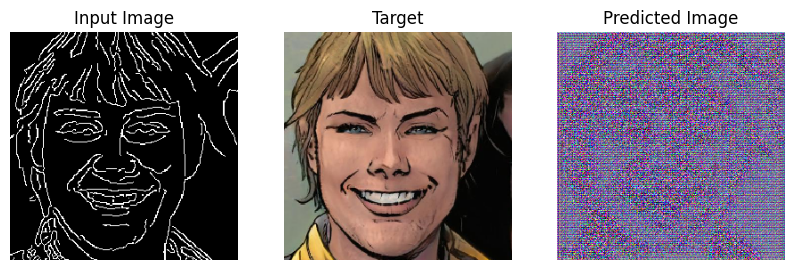

In [ ]:
def numpy_image(x):
    return np.transpose(x.detach().cpu().numpy(), (1, 2, 0)) * 0.5 + 0.5

def generate_images(
        model, inputs, target=None,
        max_images=1, show=True, fname_no_ext=""
    ):
    inputs = inputs.to(device)
    with torch.no_grad():
        outputs = model(inputs)

    # print(prediction.size())

    for i, (input, predicted_image) in enumerate(zip(inputs, outputs)):

        # print(i)
        if i >= max_images:
            break

        if target is not None:
            plt.figure(figsize=(10, 10))
            display_list = [input, target[i], predicted_image]
            title = ['Input Image', 'Target', 'Predicted Image']
        else:
            plt.figure(figsize=(10, 10))
            display_list = [input, predicted_image]
            title = ['Input Image', 'Predicted Image']

        for j in range(len(title)):
            plt.subplot(1, len(title), j+1)
            plt.title(title[j])
            # Getting the pixel values in the [0, 1] range to plot.
            plt.imshow(numpy_image(display_list[j]))
            plt.axis('off')

        if fname_no_ext:
            plt.savefig(f"{fname_no_ext}_{i:04d}.png")

        if show:
            plt.show()

        plt.close()


for i, (example_input, example_target) in enumerate(train_dataloader):
    generate_images(G, example_input, example_target)
    break

## Train the model


This follows the procedure described in the [pix2pix paper](https://arxiv.org/abs/1611.07004). Similarly to unconditional GANs, this conditional GAN (cGAN) is learning to map edges to photo.

The discriminator D learns to classify between fake (synthesised by generator) and real {edges, photo} tuples. The generator G learns to fool the discriminator.

Unlike an unconditional GAN, here, both G and D observe the input edge map.

### Training loop



The training loop procedes by separately optimizing the discriminator and generator at each iteration. The procedure can be summarized as follows:
- For each example input we use the Generator to generate an output.
- Update the discriminator by:
    -  (1) Feeding it the input image and the example target image to classify the ground truth (example) pair.
    -  (2) Feeding it the input image together with the generated output to classify the generated pair.
    -  Using these two outputs (1 and 2) to compute the discriminator loss and to update the discriminator parameters to minimize this loss. In order to update only the discriminator, when computing step (2) the generated image is \"detached\" (using the `.detach()` function) from the Torch computation graph, so that the gradients will not be \"frozen\" and not propagated back to the generator.
- Update the generator by:
    -  Computing (2) again with the updated discriminator but this time without detaching the generated image
    -  Computing the generator loss by combining the classification loss computed for the discriminator and the [L1 distance](https://montjoile.medium.com/l0-norm-l1-norm-l2-norm-l-infinity-norm-7a7d18a4f40c) between the generated image and the target one and finally updating the parameters of the generator to minimize this loss.

The full structure:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)



#### Generator loss


While GANs learn a loss that adapts to the data, cGANs (as Pix2Pix) learn a structured loss that penalizes a possible structure that differs from the network output and the target image. The generator loss consists of two terms:

-   Similarly to the discriminator case, the first term `fake_gan_loss` is a sigmoid cross-entropy loss of the (discriminated) generated images and an array of ones, i.e. considering the generated output as a real sample.
-   The second term `dist_loss` quantifies the L1 distance, i.e. the mean absolute error (absolute value of differences), between the generated image and the target image. This allows the generated image to become structurally similar to the target image.
-   These two terms are combined as `fake_gan_loss + LAMBDA * dist_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.
Feel free to experiment with modifying the value of `LAMBDA` (if you have time to spare:))

#### Discriminator loss



The discriminator loss (`disc_loss`) consists of the average of two terms, a `real_loss` and a `fake_loss`:
- The `real_loss` is the is a [binary cross-entropy loss](https://gombru.github.io/2018/05/23/cross_entropy_loss/) of the (discriminated) real images and an array of ones (since these are the real images).
- The `fake_loss` is the is a binary cross-entropy loss of the (discriminated) fake images and an array of zeros (since these are the fake images).

In [ ]:
G_optimizer = torch.optim.Adam(G.parameters(), lr=2e-4, betas=(0.5, 0.999))
D_optimizer = torch.optim.Adam(D.parameters(), lr=2e-4, betas=(0.5, 0.999))

BCE_loss = nn.BCELoss()
L1_loss = nn.L1Loss()

LAMBDA = 100 # Weight of L1 loss in optimization

def train_step(inputs, targets):
    # Generate output
    G_outputs = G(inputs)

    # ---- Update discriminator ----
    D_optimizer.zero_grad() # Clear gradients

    # Classify real and fake patches
    # Here we "freeze" generator gradients since we only optimize the discriminator
    real_patch = D(inputs, targets)
    fake_patch = D(inputs, G_outputs.detach())

    # Compute loss for real/fake patches
    # log(D(x,y)) + log(1 - D(x,G(x)))
    real_class = torch.ones_like(real_patch).to(device)
    fake_class = torch.zeros_like(fake_patch).to(device)

    real_loss = BCE_loss(real_patch, real_class)
    fake_loss = BCE_loss(fake_patch, fake_class)
    D_loss = (real_loss + fake_loss)/2

    # Propagate gradients and perform gradient descent step
    D_loss.backward()
    D_optimizer.step()

    # ---- Update generator ----
    G_optimizer.zero_grad() # Clear gradients
    # Classify fake samples, now considering generator gradients
    fake_patch = D(inputs, G_outputs)
    # Compute loss according to paper
    # log(D(x,G(x))) + L1(y,G(x))
    fake_gan_loss = BCE_loss(fake_patch, real_class)
    l1_loss = L1_loss(targets, G_outputs)
    G_loss = fake_gan_loss + LAMBDA * l1_loss

    # Propagate gradients and perform gradient descent step
    G_loss.backward()
    G_optimizer.step()

    return G_loss, D_loss

In [ ]:
def plot(d_losses, g_losses, show=True, save=False):
    """
    Book-keeping: visualize losses and one example image for the epoch
    """
    plt.figure(figsize=(12, 3))
    plt.title('Losses')
    plt.plot(g_losses, label='Generator')
    plt.legend()
    plt.plot(np.array(d_losses), label='Discriminator')
    plt.legend()
    if show:
        plt.show()
    if save:
        plt.savefig(PIX2PIX_DIR / "losses.pdf")
        plt.close()

In [ ]:
tot = len(train_dataloader) # for print formatting
print(f"The train dataset contains {tot} batches (# of iterations/epoch)!")
# Using this information, we can modify the variables below...

The train dataset contains 9000 batches (# of iterations/epoch)!


In [ ]:
# Those will contain our losses (keeping them in a different cell
# allows them to persist as we run the next cell several times)
g_losses = []
d_losses = []
iters = 0


Epoch 1/5 | Iter: 0
  Iter 100 (i  100/9000) [G loss: 36.1856 | D loss: 0.3141]
  Iter 200 (i  200/9000) [G loss: 40.2208 | D loss: 0.0766]
  Iter 300 (i  300/9000) [G loss: 35.9365 | D loss: 0.1040]
  Iter 400 (i  400/9000) [G loss: 35.8500 | D loss: 1.0917]
  Iter 500 (i  500/9000) [G loss: 34.8107 | D loss: 0.0995]
  Iter 600 (i  600/9000) [G loss: 27.6317 | D loss: 0.2954]
  Iter 700 (i  700/9000) [G loss: 35.4900 | D loss: 0.8193]
  Iter 800 (i  800/9000) [G loss: 33.2375 | D loss: 0.4885]
  Iter 900 (i  900/9000) [G loss: 39.8287 | D loss: 0.0754]
  Iter 1000 (i 1000/9000) [G loss: 36.6105 | D loss: 0.4309]
  Iter 1100 (i 1100/9000) [G loss: 43.9279 | D loss: 0.2679]
  Iter 1200 (i 1200/9000) [G loss: 37.4234 | D loss: 0.1432]
  Iter 1300 (i 1300/9000) [G loss: 40.3805 | D loss: 0.2237]
  Iter 1400 (i 1400/9000) [G loss: 47.8283 | D loss: 0.0892]
  Iter 1500 (i 1500/9000) [G loss: 29.3275 | D loss: 0.9993]
  Iter 1600 (i 1600/9000) [G loss: 37.5162 | D loss: 0.2039]
  Iter 1700 

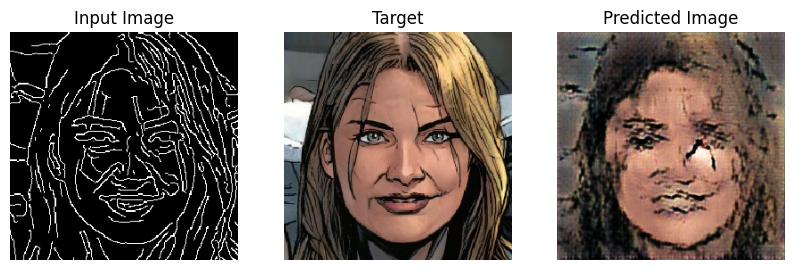

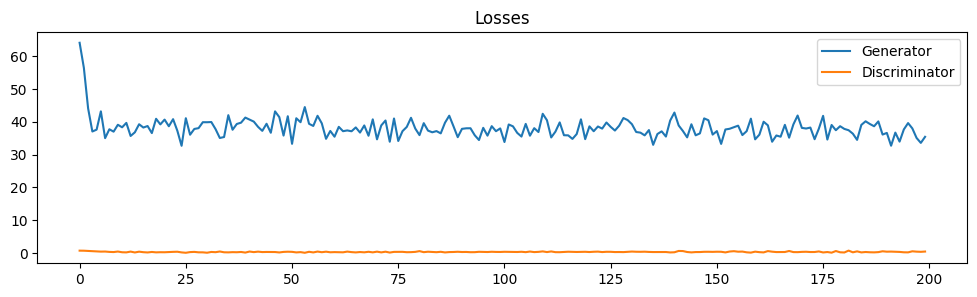

  Iter 2100 (i 2100/9000) [G loss: 34.6201 | D loss: 0.2032]
  Iter 2200 (i 2200/9000) [G loss: 32.6188 | D loss: 0.2184]
  Iter 2300 (i 2300/9000) [G loss: 68.4034 | D loss: 0.0388]
  Iter 2400 (i 2400/9000) [G loss: 38.9820 | D loss: 0.2091]
  Iter 2500 (i 2500/9000) [G loss: 30.7952 | D loss: 0.1096]
  Iter 2600 (i 2600/9000) [G loss: 28.3450 | D loss: 0.4891]
  Iter 2700 (i 2700/9000) [G loss: 32.6829 | D loss: 0.3678]
  Iter 2800 (i 2800/9000) [G loss: 39.0878 | D loss: 0.3249]
  Iter 2900 (i 2900/9000) [G loss: 38.0041 | D loss: 0.0886]
  Iter 3000 (i 3000/9000) [G loss: 35.0011 | D loss: 0.1699]
  Iter 3100 (i 3100/9000) [G loss: 32.0696 | D loss: 0.1055]
  Iter 3200 (i 3200/9000) [G loss: 43.4205 | D loss: 0.0780]
  Iter 3300 (i 3300/9000) [G loss: 35.9447 | D loss: 0.1317]
  Iter 3400 (i 3400/9000) [G loss: 34.2824 | D loss: 0.5497]
  Iter 3500 (i 3500/9000) [G loss: 29.6696 | D loss: 0.4266]
  Iter 3600 (i 3600/9000) [G loss: 46.3080 | D loss: 0.1513]
  Iter 3700 (i 3700/9000

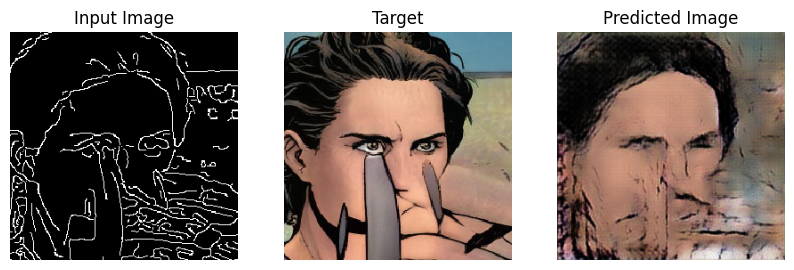

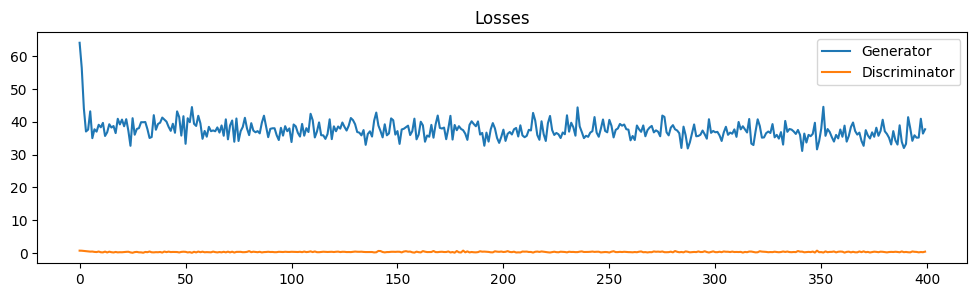

  Iter 4100 (i 4100/9000) [G loss: 34.6728 | D loss: 1.2297]
  Iter 4200 (i 4200/9000) [G loss: 34.0483 | D loss: 0.5627]
  Iter 4300 (i 4300/9000) [G loss: 33.9108 | D loss: 0.0801]
  Iter 4400 (i 4400/9000) [G loss: 34.8405 | D loss: 0.1078]
  Iter 4500 (i 4500/9000) [G loss: 42.2635 | D loss: 0.1577]
  Iter 4600 (i 4600/9000) [G loss: 33.3051 | D loss: 0.5153]
  Iter 4700 (i 4700/9000) [G loss: 36.0524 | D loss: 0.2456]
  Iter 4800 (i 4800/9000) [G loss: 33.4451 | D loss: 1.1303]
  Iter 4900 (i 4900/9000) [G loss: 46.8061 | D loss: 0.1347]
  Iter 5000 (i 5000/9000) [G loss: 31.6488 | D loss: 0.2094]
  Iter 5100 (i 5100/9000) [G loss: 42.6229 | D loss: 0.3996]
  Iter 5200 (i 5200/9000) [G loss: 33.1710 | D loss: 0.2074]
  Iter 5300 (i 5300/9000) [G loss: 41.5039 | D loss: 0.2535]
  Iter 5400 (i 5400/9000) [G loss: 34.6807 | D loss: 0.4460]
  Iter 5500 (i 5500/9000) [G loss: 37.1629 | D loss: 0.5207]
  Iter 5600 (i 5600/9000) [G loss: 41.9235 | D loss: 0.0894]
  Iter 5700 (i 5700/9000

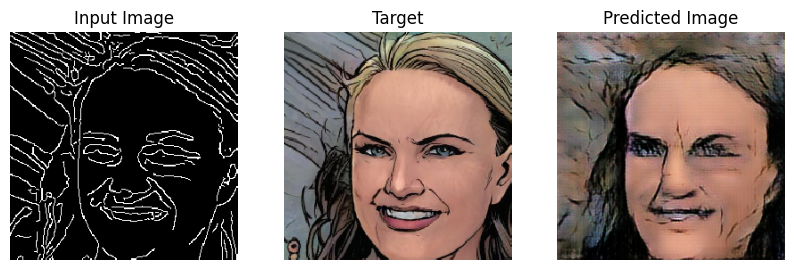

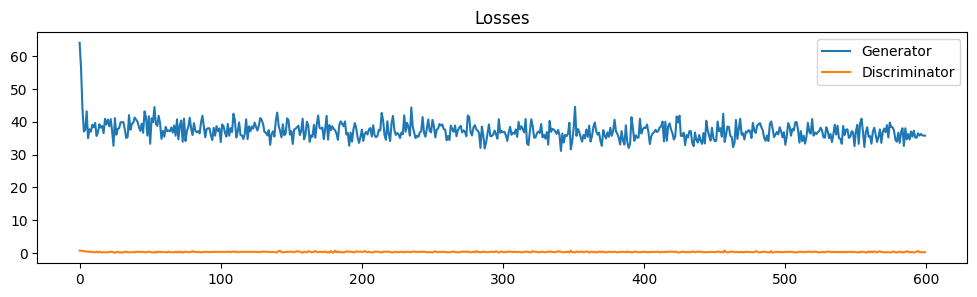

  Iter 6100 (i 6100/9000) [G loss: 27.7457 | D loss: 0.5513]
  Iter 6200 (i 6200/9000) [G loss: 40.8303 | D loss: 0.0460]
  Iter 6300 (i 6300/9000) [G loss: 40.0773 | D loss: 0.1184]
  Iter 6400 (i 6400/9000) [G loss: 28.8721 | D loss: 0.2252]
  Iter 6500 (i 6500/9000) [G loss: 44.8479 | D loss: 0.0918]
  Iter 6600 (i 6600/9000) [G loss: 39.0619 | D loss: 0.1178]
  Iter 6700 (i 6700/9000) [G loss: 26.9856 | D loss: 0.4825]
  Iter 6800 (i 6800/9000) [G loss: 37.8512 | D loss: 0.0416]
  Iter 6900 (i 6900/9000) [G loss: 43.3348 | D loss: 0.1501]
  Iter 7000 (i 7000/9000) [G loss: 32.3445 | D loss: 0.3127]
  Iter 7100 (i 7100/9000) [G loss: 37.9004 | D loss: 0.9105]
  Iter 7200 (i 7200/9000) [G loss: 48.7569 | D loss: 0.0235]
  Iter 7300 (i 7300/9000) [G loss: 47.3862 | D loss: 0.0397]
  Iter 7400 (i 7400/9000) [G loss: 32.5814 | D loss: 1.0834]
  Iter 7500 (i 7500/9000) [G loss: 37.3588 | D loss: 0.1612]
  Iter 7600 (i 7600/9000) [G loss: 40.8829 | D loss: 0.0560]
  Iter 7700 (i 7700/9000

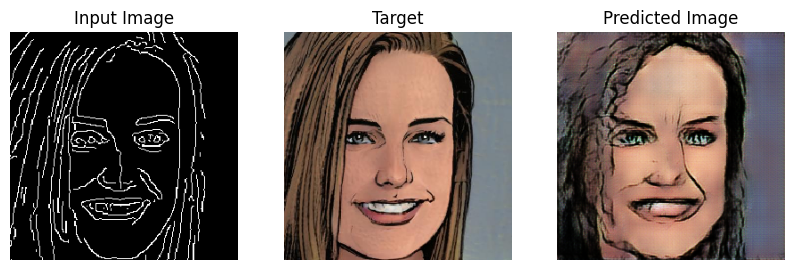

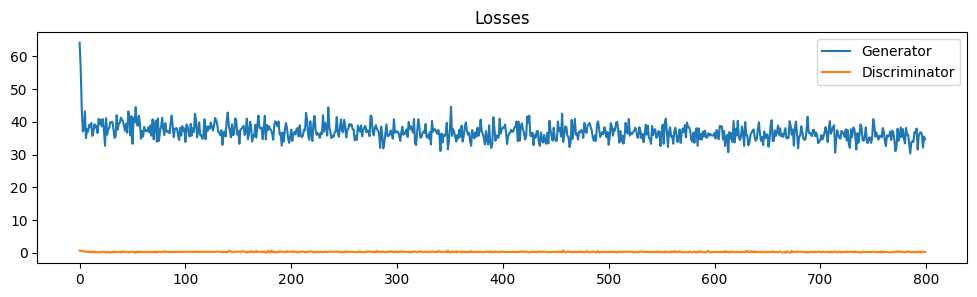

  Iter 8100 (i 8100/9000) [G loss: 43.0125 | D loss: 0.0551]
  Iter 8200 (i 8200/9000) [G loss: 27.4135 | D loss: 0.3707]
  Iter 8300 (i 8300/9000) [G loss: 43.5440 | D loss: 0.0277]
  Iter 8400 (i 8400/9000) [G loss: 42.8106 | D loss: 0.0497]
  Iter 8500 (i 8500/9000) [G loss: 39.0893 | D loss: 0.1764]
  Iter 8600 (i 8600/9000) [G loss: 29.6082 | D loss: 0.8003]
  Iter 8700 (i 8700/9000) [G loss: 39.8345 | D loss: 0.4427]
  Iter 8800 (i 8800/9000) [G loss: 27.9830 | D loss: 0.2346]
  Iter 8900 (i 8900/9000) [G loss: 32.6219 | D loss: 0.9572]
  Iter 9000 (i 9000/9000) [G loss: 34.8694 | D loss: 0.1031]

Epoch 2/5 | Iter: 9000
  Iter 9100 (i  100/9000) [G loss: 34.9168 | D loss: 0.0657]
  Iter 9200 (i  200/9000) [G loss: 43.8415 | D loss: 0.1989]
  Iter 9300 (i  300/9000) [G loss: 29.4235 | D loss: 0.1127]
  Iter 9400 (i  400/9000) [G loss: 32.1475 | D loss: 0.1816]
  Iter 9500 (i  500/9000) [G loss: 33.8878 | D loss: 0.1203]
  Iter 9600 (i  600/9000) [G loss: 34.6597 | D loss: 2.0799]


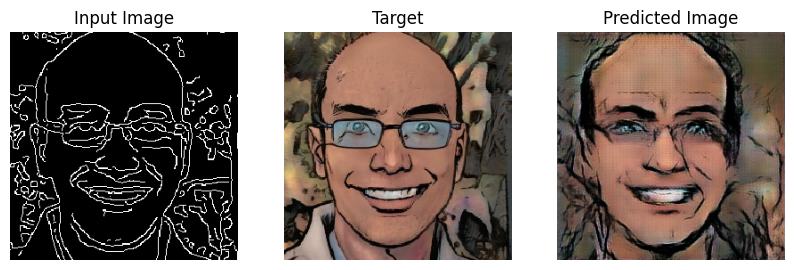

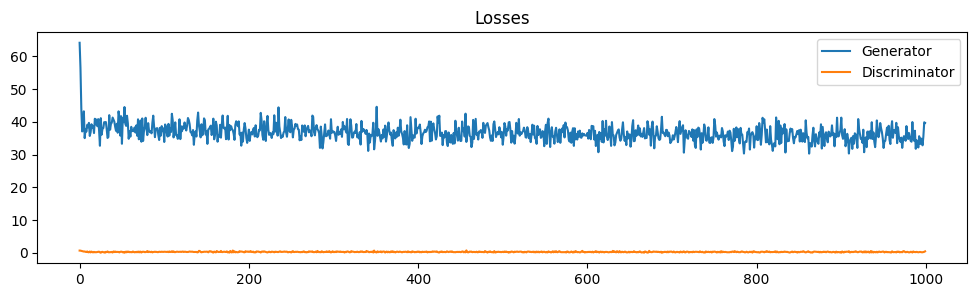

  Iter 10100 (i 1100/9000) [G loss: 33.6468 | D loss: 0.1436]
  Iter 10200 (i 1200/9000) [G loss: 42.2330 | D loss: 0.0457]
  Iter 10300 (i 1300/9000) [G loss: 34.8570 | D loss: 0.3808]
  Iter 10400 (i 1400/9000) [G loss: 36.6533 | D loss: 0.1048]
  Iter 10500 (i 1500/9000) [G loss: 33.1597 | D loss: 0.7657]
  Iter 10600 (i 1600/9000) [G loss: 29.3393 | D loss: 0.8764]
  Iter 10700 (i 1700/9000) [G loss: 41.4934 | D loss: 0.1088]
  Iter 10800 (i 1800/9000) [G loss: 49.6783 | D loss: 0.0270]
  Iter 10900 (i 1900/9000) [G loss: 34.2853 | D loss: 0.1745]
  Iter 11000 (i 2000/9000) [G loss: 24.5953 | D loss: 0.4351]
  Iter 11100 (i 2100/9000) [G loss: 35.8873 | D loss: 0.1429]
  Iter 11200 (i 2200/9000) [G loss: 30.1626 | D loss: 0.3465]
  Iter 11300 (i 2300/9000) [G loss: 28.0909 | D loss: 0.7557]
  Iter 11400 (i 2400/9000) [G loss: 32.3861 | D loss: 0.5848]
  Iter 11500 (i 2500/9000) [G loss: 48.6246 | D loss: 0.0495]
  Iter 11600 (i 2600/9000) [G loss: 36.6297 | D loss: 1.3276]
  Iter 1

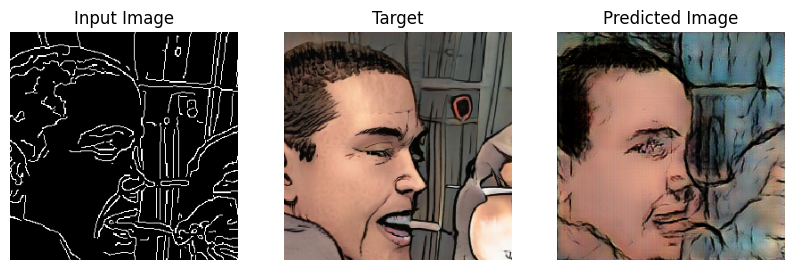

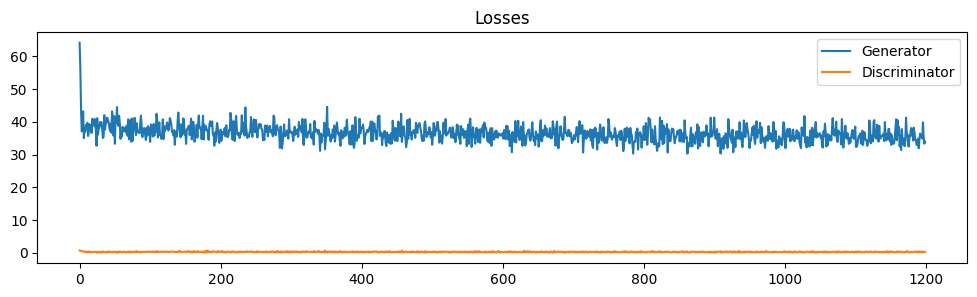

  Iter 12100 (i 3100/9000) [G loss: 41.5785 | D loss: 0.5826]
  Iter 12200 (i 3200/9000) [G loss: 34.8077 | D loss: 0.0687]
  Iter 12300 (i 3300/9000) [G loss: 38.6658 | D loss: 0.1516]
  Iter 12400 (i 3400/9000) [G loss: 28.5644 | D loss: 0.1088]
  Iter 12500 (i 3500/9000) [G loss: 29.1512 | D loss: 0.0856]
  Iter 12600 (i 3600/9000) [G loss: 34.8671 | D loss: 0.1696]
  Iter 12700 (i 3700/9000) [G loss: 32.3144 | D loss: 0.0684]
  Iter 12800 (i 3800/9000) [G loss: 39.3417 | D loss: 0.3833]
  Iter 12900 (i 3900/9000) [G loss: 39.0298 | D loss: 0.0555]
  Iter 13000 (i 4000/9000) [G loss: 47.6347 | D loss: 0.0352]
  Iter 13100 (i 4100/9000) [G loss: 36.0719 | D loss: 0.1234]
  Iter 13200 (i 4200/9000) [G loss: 39.6501 | D loss: 0.0372]
  Iter 13300 (i 4300/9000) [G loss: 33.2081 | D loss: 0.4767]
  Iter 13400 (i 4400/9000) [G loss: 33.1919 | D loss: 0.7841]
  Iter 13500 (i 4500/9000) [G loss: 50.8135 | D loss: 0.0296]
  Iter 13600 (i 4600/9000) [G loss: 37.3851 | D loss: 0.2839]
  Iter 1

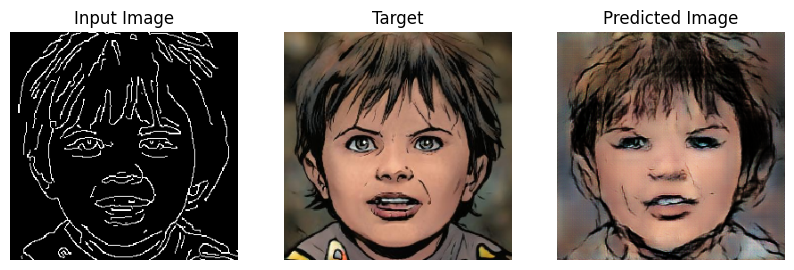

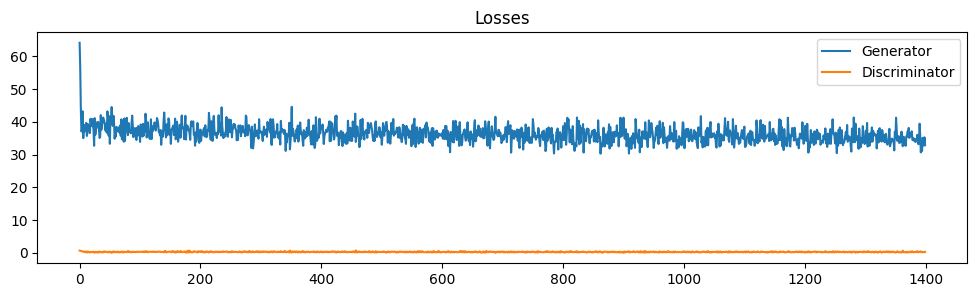

  Iter 14100 (i 5100/9000) [G loss: 39.3874 | D loss: 0.1163]
  Iter 14200 (i 5200/9000) [G loss: 31.8319 | D loss: 0.6030]
  Iter 14300 (i 5300/9000) [G loss: 33.5984 | D loss: 0.0864]
  Iter 14400 (i 5400/9000) [G loss: 29.7725 | D loss: 0.4533]
  Iter 14500 (i 5500/9000) [G loss: 26.2982 | D loss: 0.4815]
  Iter 14600 (i 5600/9000) [G loss: 33.6435 | D loss: 0.0933]
  Iter 14700 (i 5700/9000) [G loss: 36.5374 | D loss: 0.2705]
  Iter 14800 (i 5800/9000) [G loss: 31.0443 | D loss: 0.7118]
  Iter 14900 (i 5900/9000) [G loss: 35.9680 | D loss: 0.0951]
  Iter 15000 (i 6000/9000) [G loss: 39.1157 | D loss: 0.2823]
  Iter 15100 (i 6100/9000) [G loss: 35.5672 | D loss: 0.1287]
  Iter 15200 (i 6200/9000) [G loss: 30.7694 | D loss: 0.2873]
  Iter 15300 (i 6300/9000) [G loss: 39.7714 | D loss: 0.0260]
  Iter 15400 (i 6400/9000) [G loss: 42.7003 | D loss: 0.5254]
  Iter 15500 (i 6500/9000) [G loss: 28.8200 | D loss: 0.1987]
  Iter 15600 (i 6600/9000) [G loss: 32.8428 | D loss: 0.0748]
  Iter 1

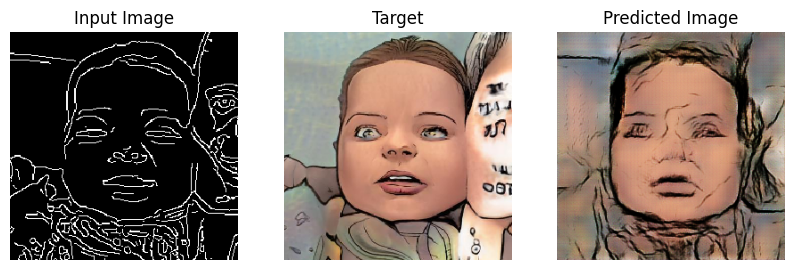

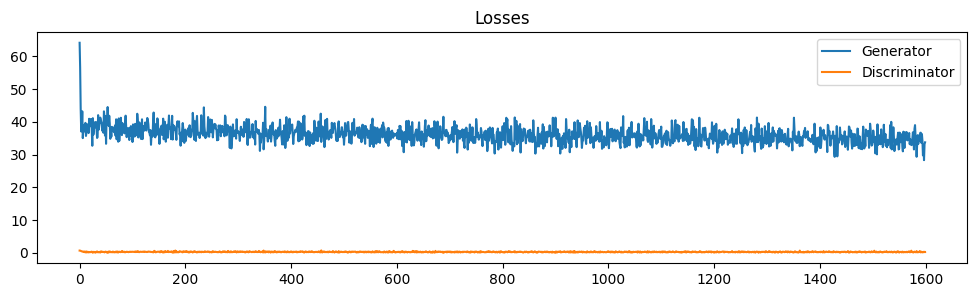

  Iter 16100 (i 7100/9000) [G loss: 32.4062 | D loss: 0.0740]
  Iter 16200 (i 7200/9000) [G loss: 33.5488 | D loss: 0.0869]
  Iter 16300 (i 7300/9000) [G loss: 26.5366 | D loss: 0.5649]
  Iter 16400 (i 7400/9000) [G loss: 45.1971 | D loss: 0.1303]
  Iter 16500 (i 7500/9000) [G loss: 30.1749 | D loss: 0.3729]
  Iter 16600 (i 7600/9000) [G loss: 36.4324 | D loss: 0.1268]
  Iter 16700 (i 7700/9000) [G loss: 31.7463 | D loss: 0.2519]
  Iter 16800 (i 7800/9000) [G loss: 27.1463 | D loss: 0.3574]
  Iter 16900 (i 7900/9000) [G loss: 40.7091 | D loss: 0.2318]
  Iter 17000 (i 8000/9000) [G loss: 35.0087 | D loss: 0.3637]
  Iter 17100 (i 8100/9000) [G loss: 36.2201 | D loss: 0.1158]
  Iter 17200 (i 8200/9000) [G loss: 34.5769 | D loss: 0.3542]
  Iter 17300 (i 8300/9000) [G loss: 47.2108 | D loss: 0.0785]
  Iter 17400 (i 8400/9000) [G loss: 34.0185 | D loss: 0.8737]
  Iter 17500 (i 8500/9000) [G loss: 37.8497 | D loss: 0.0845]
  Iter 17600 (i 8600/9000) [G loss: 26.7244 | D loss: 0.1872]
  Iter 1

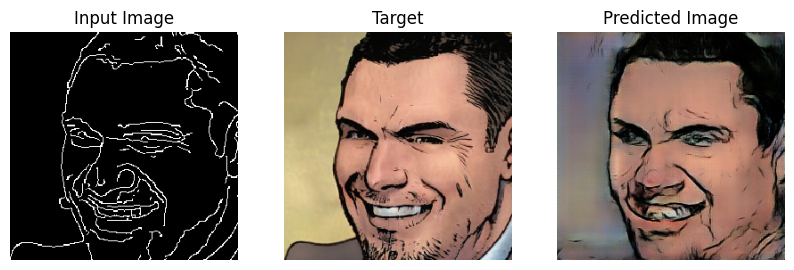

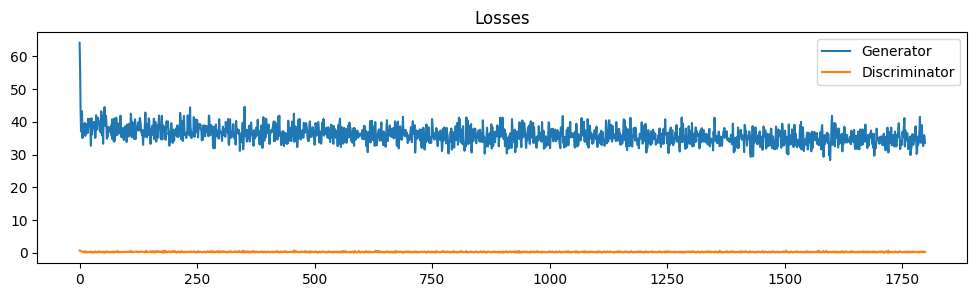


Epoch 3/5 | Iter: 18000
  Iter 18100 (i  100/9000) [G loss: 30.3451 | D loss: 0.2435]
  Iter 18200 (i  200/9000) [G loss: 30.1938 | D loss: 0.4975]
  Iter 18300 (i  300/9000) [G loss: 40.1218 | D loss: 0.0102]
  Iter 18400 (i  400/9000) [G loss: 31.1015 | D loss: 0.1915]
  Iter 18500 (i  500/9000) [G loss: 40.8814 | D loss: 0.0835]
  Iter 18600 (i  600/9000) [G loss: 35.9921 | D loss: 0.2382]
  Iter 18700 (i  700/9000) [G loss: 33.7298 | D loss: 0.1580]
  Iter 18800 (i  800/9000) [G loss: 49.0327 | D loss: 0.3556]
  Iter 18900 (i  900/9000) [G loss: 40.9488 | D loss: 0.1138]
  Iter 19000 (i 1000/9000) [G loss: 27.7613 | D loss: 0.0866]
  Iter 19100 (i 1100/9000) [G loss: 30.8525 | D loss: 0.2077]
  Iter 19200 (i 1200/9000) [G loss: 38.5280 | D loss: 0.0671]
  Iter 19300 (i 1300/9000) [G loss: 34.8802 | D loss: 0.4271]
  Iter 19400 (i 1400/9000) [G loss: 30.9958 | D loss: 0.1464]
  Iter 19500 (i 1500/9000) [G loss: 40.6291 | D loss: 0.0130]
  Iter 19600 (i 1600/9000) [G loss: 34.7293 |

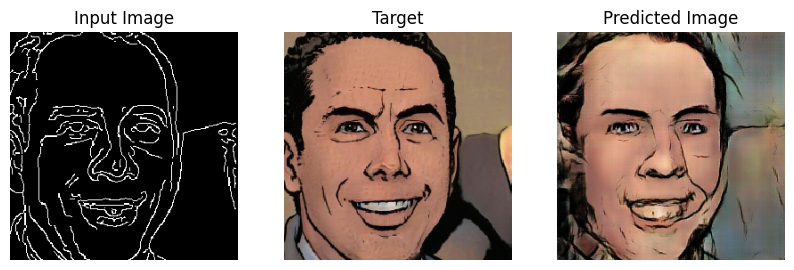

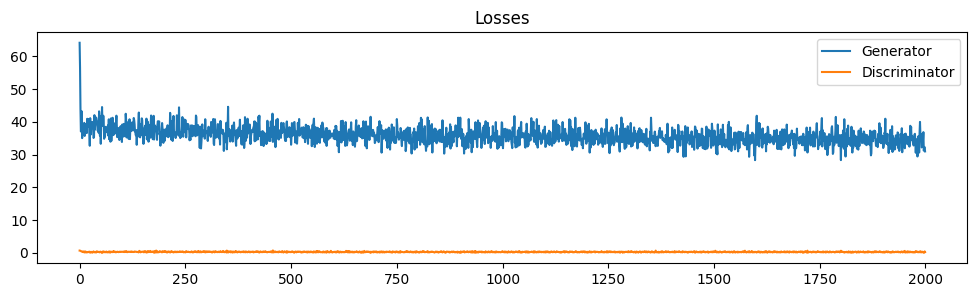

  Iter 20100 (i 2100/9000) [G loss: 41.5681 | D loss: 0.0808]
  Iter 20200 (i 2200/9000) [G loss: 25.2562 | D loss: 0.5079]
  Iter 20300 (i 2300/9000) [G loss: 35.0801 | D loss: 0.1039]
  Iter 20400 (i 2400/9000) [G loss: 31.8365 | D loss: 0.3140]
  Iter 20500 (i 2500/9000) [G loss: 25.7147 | D loss: 0.3783]
  Iter 20600 (i 2600/9000) [G loss: 42.5668 | D loss: 0.0246]
  Iter 20700 (i 2700/9000) [G loss: 54.5637 | D loss: 0.0694]
  Iter 20800 (i 2800/9000) [G loss: 41.8284 | D loss: 0.0500]
  Iter 20900 (i 2900/9000) [G loss: 40.5980 | D loss: 0.0771]
  Iter 21000 (i 3000/9000) [G loss: 34.6382 | D loss: 0.1921]
  Iter 21100 (i 3100/9000) [G loss: 32.2404 | D loss: 0.5440]
  Iter 21200 (i 3200/9000) [G loss: 41.7856 | D loss: 0.5805]
  Iter 21300 (i 3300/9000) [G loss: 30.8910 | D loss: 0.1325]
  Iter 21400 (i 3400/9000) [G loss: 37.3659 | D loss: 0.2581]
  Iter 21500 (i 3500/9000) [G loss: 33.7288 | D loss: 0.0671]
  Iter 21600 (i 3600/9000) [G loss: 36.7290 | D loss: 0.1282]
  Iter 2

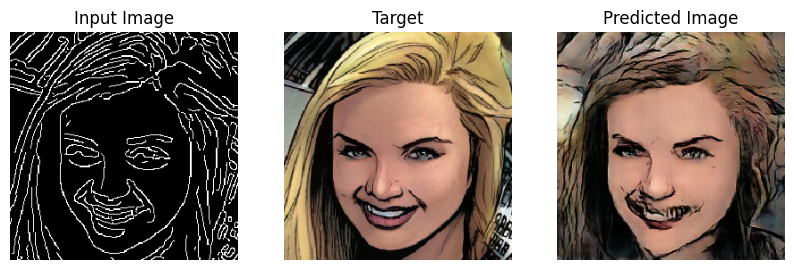

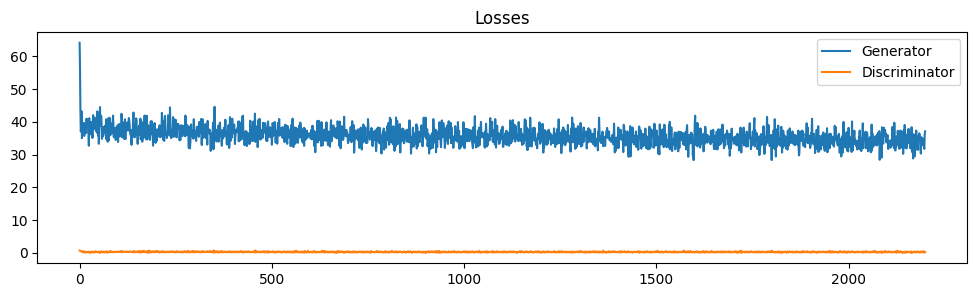

  Iter 22100 (i 4100/9000) [G loss: 30.7330 | D loss: 0.5329]
  Iter 22200 (i 4200/9000) [G loss: 26.3628 | D loss: 0.2823]
  Iter 22300 (i 4300/9000) [G loss: 32.1475 | D loss: 1.0804]
  Iter 22400 (i 4400/9000) [G loss: 26.4476 | D loss: 0.6786]
  Iter 22500 (i 4500/9000) [G loss: 39.6650 | D loss: 0.8126]
  Iter 22600 (i 4600/9000) [G loss: 31.1223 | D loss: 0.4155]
  Iter 22700 (i 4700/9000) [G loss: 35.6807 | D loss: 0.1607]
  Iter 22800 (i 4800/9000) [G loss: 29.1109 | D loss: 0.3229]
  Iter 22900 (i 4900/9000) [G loss: 32.8869 | D loss: 0.1820]
  Iter 23000 (i 5000/9000) [G loss: 29.8735 | D loss: 0.1858]
  Iter 23100 (i 5100/9000) [G loss: 35.1327 | D loss: 0.0171]
  Iter 23200 (i 5200/9000) [G loss: 36.9281 | D loss: 0.0591]
  Iter 23300 (i 5300/9000) [G loss: 32.9436 | D loss: 0.1229]
  Iter 23400 (i 5400/9000) [G loss: 41.0355 | D loss: 0.0371]
  Iter 23500 (i 5500/9000) [G loss: 31.8187 | D loss: 0.1211]
  Iter 23600 (i 5600/9000) [G loss: 39.2582 | D loss: 0.1728]
  Iter 2

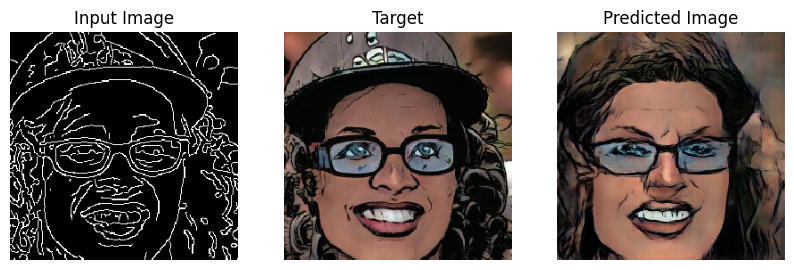

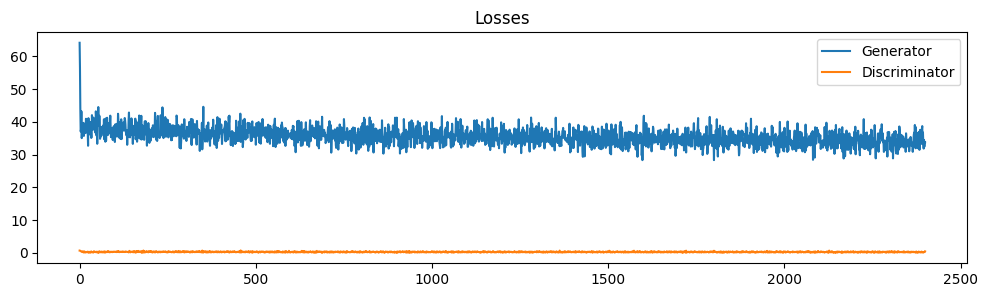

  Iter 24100 (i 6100/9000) [G loss: 35.9041 | D loss: 0.1156]
  Iter 24200 (i 6200/9000) [G loss: 25.5934 | D loss: 0.8113]
  Iter 24300 (i 6300/9000) [G loss: 29.2036 | D loss: 0.1122]
  Iter 24400 (i 6400/9000) [G loss: 36.8544 | D loss: 0.0666]
  Iter 24500 (i 6500/9000) [G loss: 29.6518 | D loss: 0.6202]
  Iter 24600 (i 6600/9000) [G loss: 41.4126 | D loss: 0.1723]
  Iter 24700 (i 6700/9000) [G loss: 40.8233 | D loss: 0.1922]
  Iter 24800 (i 6800/9000) [G loss: 27.1038 | D loss: 0.2669]
  Iter 24900 (i 6900/9000) [G loss: 41.5898 | D loss: 0.1232]
  Iter 25000 (i 7000/9000) [G loss: 40.8747 | D loss: 1.2384]
  Iter 25100 (i 7100/9000) [G loss: 34.8988 | D loss: 0.3798]
  Iter 25200 (i 7200/9000) [G loss: 30.1637 | D loss: 1.2540]
  Iter 25300 (i 7300/9000) [G loss: 27.4363 | D loss: 0.3235]
  Iter 25400 (i 7400/9000) [G loss: 30.5868 | D loss: 0.2647]
  Iter 25500 (i 7500/9000) [G loss: 42.0607 | D loss: 0.1137]
  Iter 25600 (i 7600/9000) [G loss: 42.7215 | D loss: 0.1217]
  Iter 2

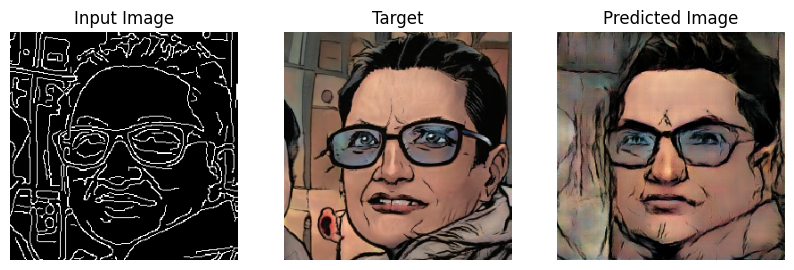

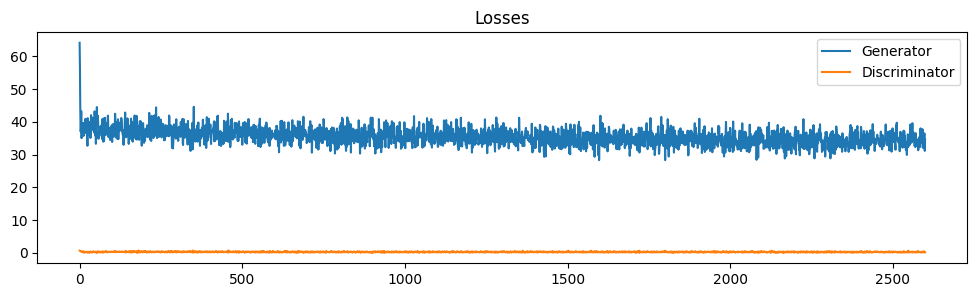

  Iter 26100 (i 8100/9000) [G loss: 35.5866 | D loss: 0.0506]
  Iter 26200 (i 8200/9000) [G loss: 38.5652 | D loss: 0.0475]
  Iter 26300 (i 8300/9000) [G loss: 32.2012 | D loss: 0.1653]
  Iter 26400 (i 8400/9000) [G loss: 29.7053 | D loss: 0.1349]
  Iter 26500 (i 8500/9000) [G loss: 43.4538 | D loss: 0.0072]
  Iter 26600 (i 8600/9000) [G loss: 21.2831 | D loss: 0.7696]
  Iter 26700 (i 8700/9000) [G loss: 32.0049 | D loss: 0.2137]
  Iter 26800 (i 8800/9000) [G loss: 36.1643 | D loss: 0.1259]
  Iter 26900 (i 8900/9000) [G loss: 30.0365 | D loss: 0.1300]
  Iter 27000 (i 9000/9000) [G loss: 32.4169 | D loss: 1.1335]

Epoch 4/5 | Iter: 27000
  Iter 27100 (i  100/9000) [G loss: 27.1287 | D loss: 0.1371]
  Iter 27200 (i  200/9000) [G loss: 32.8706 | D loss: 0.1363]
  Iter 27300 (i  300/9000) [G loss: 37.0074 | D loss: 0.0442]
  Iter 27400 (i  400/9000) [G loss: 40.6368 | D loss: 0.1843]
  Iter 27500 (i  500/9000) [G loss: 34.7597 | D loss: 0.2259]
  Iter 27600 (i  600/9000) [G loss: 34.7006 |

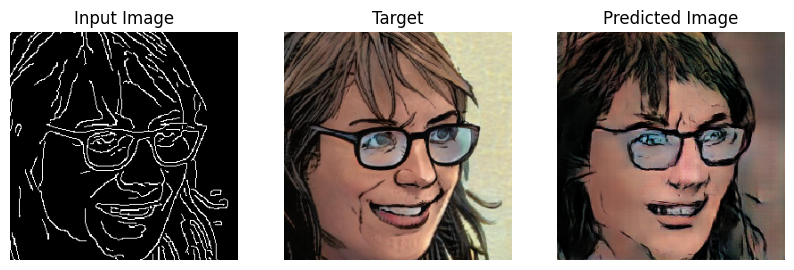

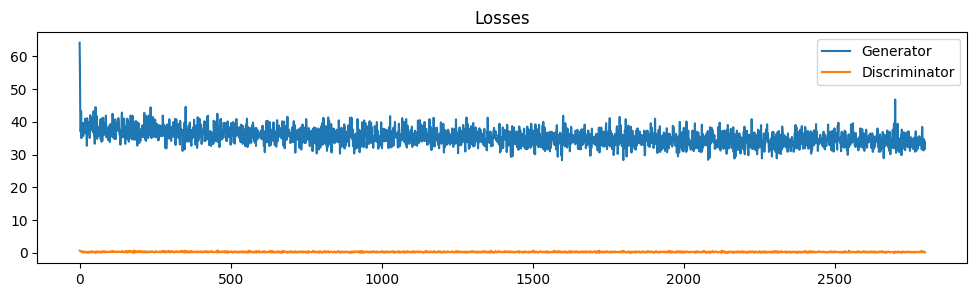

  Iter 28100 (i 1100/9000) [G loss: 24.9258 | D loss: 0.2513]
  Iter 28200 (i 1200/9000) [G loss: 37.6567 | D loss: 0.0850]
  Iter 28300 (i 1300/9000) [G loss: 59.2584 | D loss: 0.1747]
  Iter 28400 (i 1400/9000) [G loss: 27.0867 | D loss: 0.6346]
  Iter 28500 (i 1500/9000) [G loss: 38.3318 | D loss: 0.0207]
  Iter 28600 (i 1600/9000) [G loss: 33.4242 | D loss: 0.0447]
  Iter 28700 (i 1700/9000) [G loss: 28.5410 | D loss: 0.4435]
  Iter 28800 (i 1800/9000) [G loss: 28.5832 | D loss: 0.2274]
  Iter 28900 (i 1900/9000) [G loss: 43.0006 | D loss: 0.1083]
  Iter 29000 (i 2000/9000) [G loss: 35.3353 | D loss: 0.1407]
  Iter 29100 (i 2100/9000) [G loss: 27.5254 | D loss: 0.3901]
  Iter 29200 (i 2200/9000) [G loss: 35.3008 | D loss: 0.0520]
  Iter 29300 (i 2300/9000) [G loss: 37.2159 | D loss: 0.1541]
  Iter 29400 (i 2400/9000) [G loss: 28.8268 | D loss: 0.1049]
  Iter 29500 (i 2500/9000) [G loss: 40.2648 | D loss: 0.0306]
  Iter 29600 (i 2600/9000) [G loss: 40.7545 | D loss: 0.0155]
  Iter 2

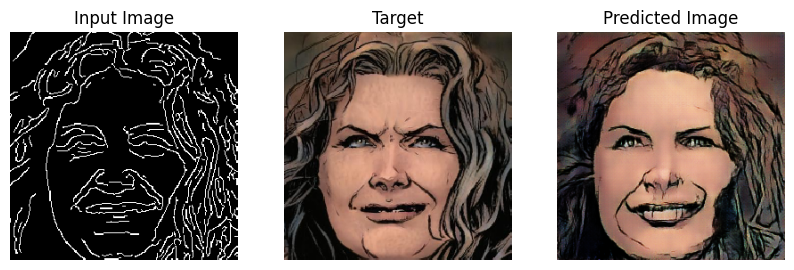

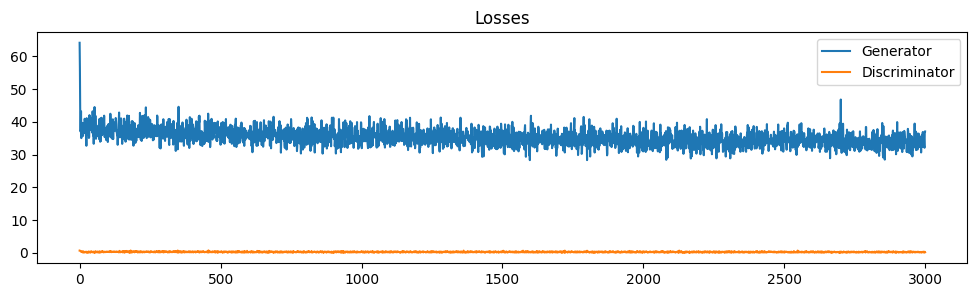

  Iter 30100 (i 3100/9000) [G loss: 29.9446 | D loss: 0.4510]
  Iter 30200 (i 3200/9000) [G loss: 27.3200 | D loss: 0.2057]
  Iter 30300 (i 3300/9000) [G loss: 27.4952 | D loss: 0.2588]
  Iter 30400 (i 3400/9000) [G loss: 31.0262 | D loss: 0.0859]
  Iter 30500 (i 3500/9000) [G loss: 33.5933 | D loss: 0.0538]
  Iter 30600 (i 3600/9000) [G loss: 30.0671 | D loss: 0.0680]
  Iter 30700 (i 3700/9000) [G loss: 31.9630 | D loss: 0.3127]
  Iter 30800 (i 3800/9000) [G loss: 36.1138 | D loss: 0.0404]
  Iter 30900 (i 3900/9000) [G loss: 29.7778 | D loss: 0.0760]
  Iter 31000 (i 4000/9000) [G loss: 31.6000 | D loss: 0.1362]
  Iter 31100 (i 4100/9000) [G loss: 64.9803 | D loss: 0.0766]
  Iter 31200 (i 4200/9000) [G loss: 42.9893 | D loss: 0.0139]
  Iter 31300 (i 4300/9000) [G loss: 34.6566 | D loss: 0.1721]
  Iter 31400 (i 4400/9000) [G loss: 28.1082 | D loss: 0.8538]
  Iter 31500 (i 4500/9000) [G loss: 32.4777 | D loss: 0.5322]
  Iter 31600 (i 4600/9000) [G loss: 39.4151 | D loss: 0.0156]
  Iter 3

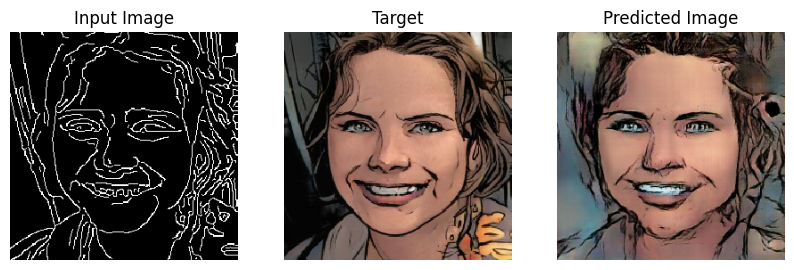

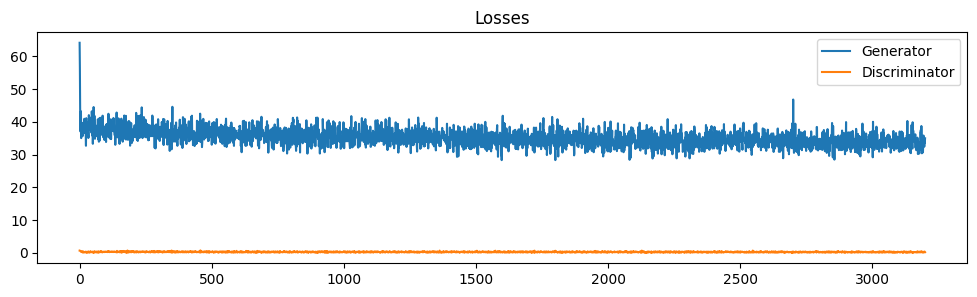

  Iter 32100 (i 5100/9000) [G loss: 31.1760 | D loss: 0.1548]
  Iter 32200 (i 5200/9000) [G loss: 24.9217 | D loss: 0.1578]
  Iter 32300 (i 5300/9000) [G loss: 25.3136 | D loss: 0.4792]
  Iter 32400 (i 5400/9000) [G loss: 31.4355 | D loss: 0.7114]
  Iter 32500 (i 5500/9000) [G loss: 34.0406 | D loss: 0.1258]
  Iter 32600 (i 5600/9000) [G loss: 18.1262 | D loss: 0.5455]
  Iter 32700 (i 5700/9000) [G loss: 36.2222 | D loss: 0.3424]
  Iter 32800 (i 5800/9000) [G loss: 23.8282 | D loss: 1.0133]
  Iter 32900 (i 5900/9000) [G loss: 32.8340 | D loss: 0.2888]
  Iter 33000 (i 6000/9000) [G loss: 30.9943 | D loss: 0.4042]
  Iter 33100 (i 6100/9000) [G loss: 48.5047 | D loss: 0.0494]
  Iter 33200 (i 6200/9000) [G loss: 26.4364 | D loss: 0.3575]
  Iter 33300 (i 6300/9000) [G loss: 38.0359 | D loss: 0.3874]
  Iter 33400 (i 6400/9000) [G loss: 25.6756 | D loss: 0.2344]
  Iter 33500 (i 6500/9000) [G loss: 37.5378 | D loss: 0.5470]
  Iter 33600 (i 6600/9000) [G loss: 30.5850 | D loss: 0.2207]
  Iter 3

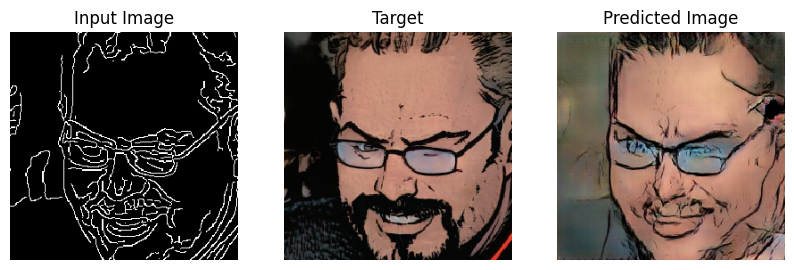

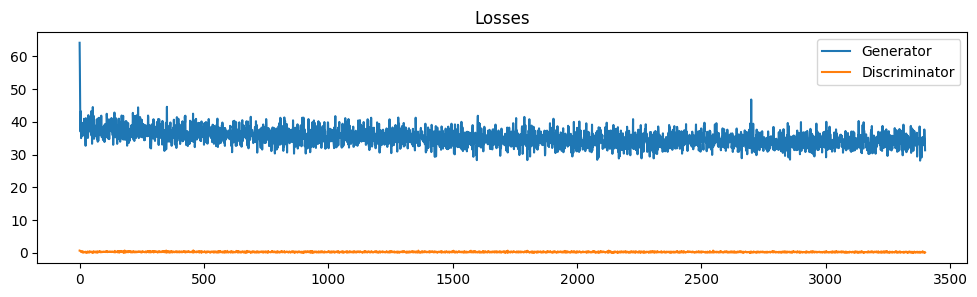

  Iter 34100 (i 7100/9000) [G loss: 42.3255 | D loss: 0.1513]
  Iter 34200 (i 7200/9000) [G loss: 53.9775 | D loss: 0.0362]
  Iter 34300 (i 7300/9000) [G loss: 37.5177 | D loss: 0.1511]
  Iter 34400 (i 7400/9000) [G loss: 35.0047 | D loss: 0.0238]
  Iter 34500 (i 7500/9000) [G loss: 32.2871 | D loss: 0.0625]
  Iter 34600 (i 7600/9000) [G loss: 30.4491 | D loss: 0.7884]
  Iter 34700 (i 7700/9000) [G loss: 28.3883 | D loss: 0.3966]
  Iter 34800 (i 7800/9000) [G loss: 31.4840 | D loss: 0.1377]
  Iter 34900 (i 7900/9000) [G loss: 35.4621 | D loss: 0.3090]
  Iter 35000 (i 8000/9000) [G loss: 30.6119 | D loss: 0.1044]
  Iter 35100 (i 8100/9000) [G loss: 27.8131 | D loss: 0.5646]
  Iter 35200 (i 8200/9000) [G loss: 30.0279 | D loss: 0.2853]
  Iter 35300 (i 8300/9000) [G loss: 41.6164 | D loss: 0.0354]
  Iter 35400 (i 8400/9000) [G loss: 47.6380 | D loss: 0.0134]
  Iter 35500 (i 8500/9000) [G loss: 37.4166 | D loss: 0.0737]
  Iter 35600 (i 8600/9000) [G loss: 31.2601 | D loss: 0.4067]
  Iter 3

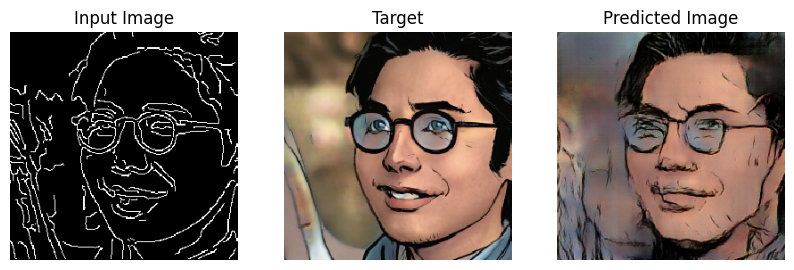

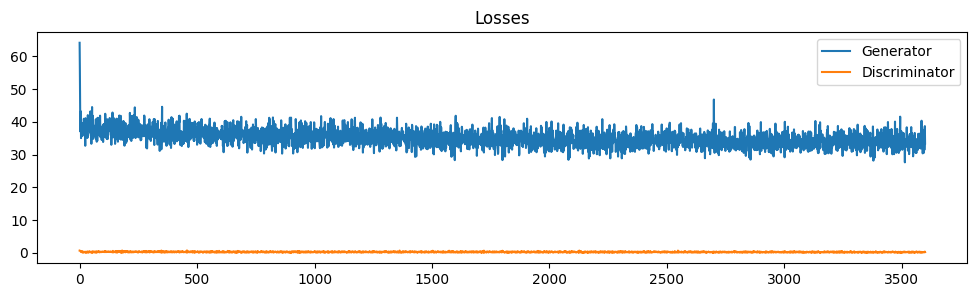


Epoch 5/5 | Iter: 36000
  Iter 36100 (i  100/9000) [G loss: 38.8950 | D loss: 0.1574]
  Iter 36200 (i  200/9000) [G loss: 36.1931 | D loss: 0.0361]
  Iter 36300 (i  300/9000) [G loss: 22.5970 | D loss: 0.7116]
  Iter 36400 (i  400/9000) [G loss: 26.1359 | D loss: 0.3084]
  Iter 36500 (i  500/9000) [G loss: 42.9859 | D loss: 0.3205]
  Iter 36600 (i  600/9000) [G loss: 32.1733 | D loss: 0.3403]
  Iter 36700 (i  700/9000) [G loss: 33.7474 | D loss: 0.0882]
  Iter 36800 (i  800/9000) [G loss: 34.8306 | D loss: 0.1610]
  Iter 36900 (i  900/9000) [G loss: 33.5496 | D loss: 0.2422]
  Iter 37000 (i 1000/9000) [G loss: 44.4775 | D loss: 0.0753]
  Iter 37100 (i 1100/9000) [G loss: 25.7511 | D loss: 0.1960]
  Iter 37200 (i 1200/9000) [G loss: 30.5997 | D loss: 0.3282]
  Iter 37300 (i 1300/9000) [G loss: 41.3495 | D loss: 0.0754]
  Iter 37400 (i 1400/9000) [G loss: 31.3935 | D loss: 0.0788]
  Iter 37500 (i 1500/9000) [G loss: 23.4196 | D loss: 0.5062]
  Iter 37600 (i 1600/9000) [G loss: 25.6831 |

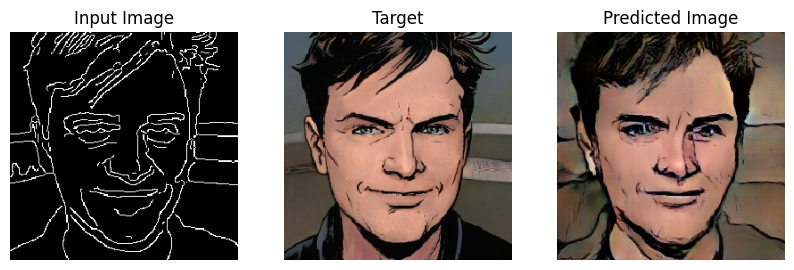

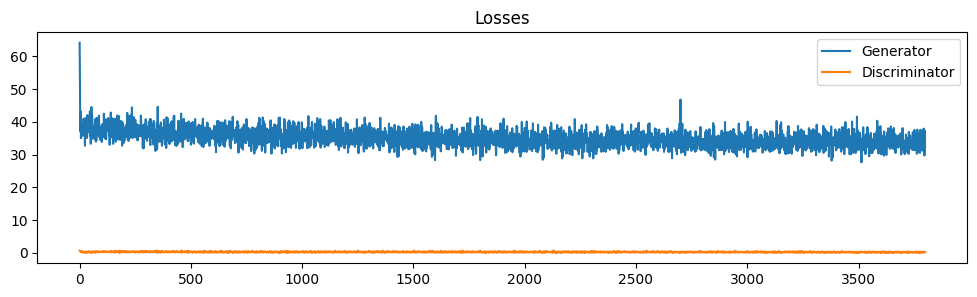

  Iter 38100 (i 2100/9000) [G loss: 31.3682 | D loss: 0.8111]
  Iter 38200 (i 2200/9000) [G loss: 34.0439 | D loss: 0.2960]
  Iter 38300 (i 2300/9000) [G loss: 43.3558 | D loss: 0.1901]
  Iter 38400 (i 2400/9000) [G loss: 30.6808 | D loss: 0.0819]
  Iter 38500 (i 2500/9000) [G loss: 27.9008 | D loss: 0.1011]
  Iter 38600 (i 2600/9000) [G loss: 33.6861 | D loss: 0.1518]
  Iter 38700 (i 2700/9000) [G loss: 31.2404 | D loss: 0.2554]
  Iter 38800 (i 2800/9000) [G loss: 24.3968 | D loss: 0.1311]
  Iter 38900 (i 2900/9000) [G loss: 62.5844 | D loss: 0.0495]
  Iter 39000 (i 3000/9000) [G loss: 33.1799 | D loss: 0.4617]
  Iter 39100 (i 3100/9000) [G loss: 33.6109 | D loss: 0.0493]
  Iter 39200 (i 3200/9000) [G loss: 31.6247 | D loss: 0.0328]
  Iter 39300 (i 3300/9000) [G loss: 33.8966 | D loss: 0.0336]
  Iter 39400 (i 3400/9000) [G loss: 36.1877 | D loss: 0.1434]
  Iter 39500 (i 3500/9000) [G loss: 31.2687 | D loss: 0.1114]
  Iter 39600 (i 3600/9000) [G loss: 23.9637 | D loss: 0.3676]
  Iter 3

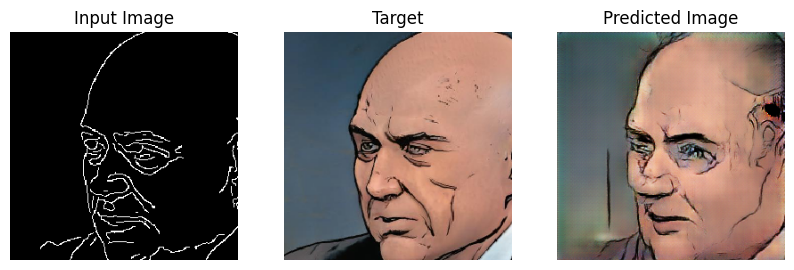

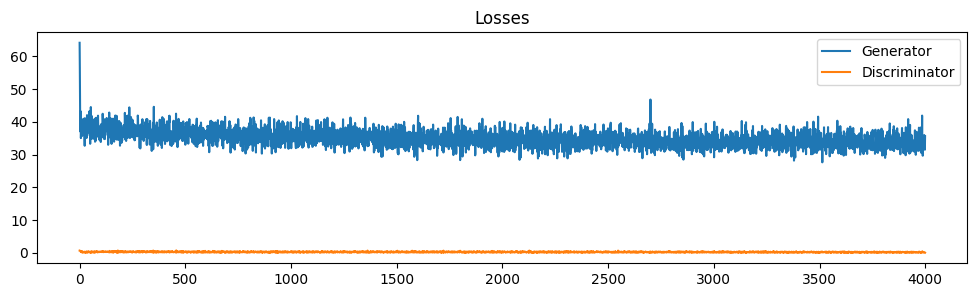

  Iter 40100 (i 4100/9000) [G loss: 27.6413 | D loss: 0.3869]
  Iter 40200 (i 4200/9000) [G loss: 34.3188 | D loss: 0.1654]
  Iter 40300 (i 4300/9000) [G loss: 27.6344 | D loss: 0.3458]
  Iter 40400 (i 4400/9000) [G loss: 32.3436 | D loss: 0.4451]
  Iter 40500 (i 4500/9000) [G loss: 31.0255 | D loss: 0.4427]
  Iter 40600 (i 4600/9000) [G loss: 37.8772 | D loss: 0.0344]
  Iter 40700 (i 4700/9000) [G loss: 32.9581 | D loss: 0.0802]
  Iter 40800 (i 4800/9000) [G loss: 28.6443 | D loss: 0.2025]
  Iter 40900 (i 4900/9000) [G loss: 30.8984 | D loss: 0.3340]
  Iter 41000 (i 5000/9000) [G loss: 33.8390 | D loss: 0.0520]
  Iter 41100 (i 5100/9000) [G loss: 25.7544 | D loss: 0.1372]
  Iter 41200 (i 5200/9000) [G loss: 35.8566 | D loss: 0.0106]
  Iter 41300 (i 5300/9000) [G loss: 26.8922 | D loss: 0.1992]
  Iter 41400 (i 5400/9000) [G loss: 35.9032 | D loss: 0.0983]
  Iter 41500 (i 5500/9000) [G loss: 26.9560 | D loss: 0.3732]
  Iter 41600 (i 5600/9000) [G loss: 37.9954 | D loss: 0.1154]
  Iter 4

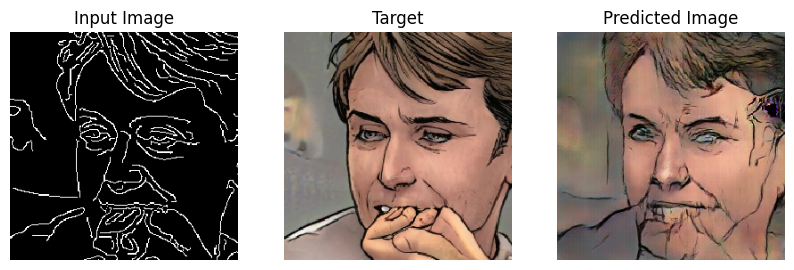

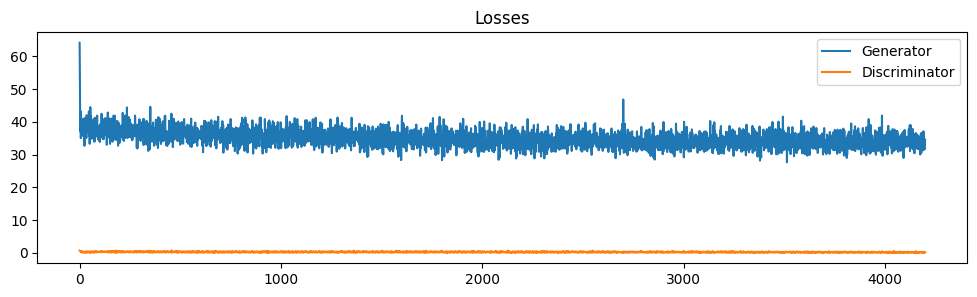

  Iter 42100 (i 6100/9000) [G loss: 36.8393 | D loss: 0.2843]
  Iter 42200 (i 6200/9000) [G loss: 39.1329 | D loss: 0.0401]
  Iter 42300 (i 6300/9000) [G loss: 31.4544 | D loss: 0.2623]
  Iter 42400 (i 6400/9000) [G loss: 37.7799 | D loss: 0.0626]
  Iter 42500 (i 6500/9000) [G loss: 30.9363 | D loss: 0.2107]
  Iter 42600 (i 6600/9000) [G loss: 36.7961 | D loss: 0.1134]
  Iter 42700 (i 6700/9000) [G loss: 50.5410 | D loss: 0.2805]
  Iter 42800 (i 6800/9000) [G loss: 33.8227 | D loss: 0.3491]
  Iter 42900 (i 6900/9000) [G loss: 32.4848 | D loss: 0.2002]
  Iter 43000 (i 7000/9000) [G loss: 37.9180 | D loss: 0.0241]
  Iter 43100 (i 7100/9000) [G loss: 37.0067 | D loss: 0.0607]
  Iter 43200 (i 7200/9000) [G loss: 33.2973 | D loss: 0.0518]
  Iter 43300 (i 7300/9000) [G loss: 29.2217 | D loss: 0.0256]
  Iter 43400 (i 7400/9000) [G loss: 35.1581 | D loss: 0.2056]
  Iter 43500 (i 7500/9000) [G loss: 42.6632 | D loss: 0.6347]
  Iter 43600 (i 7600/9000) [G loss: 36.8931 | D loss: 0.1914]
  Iter 4

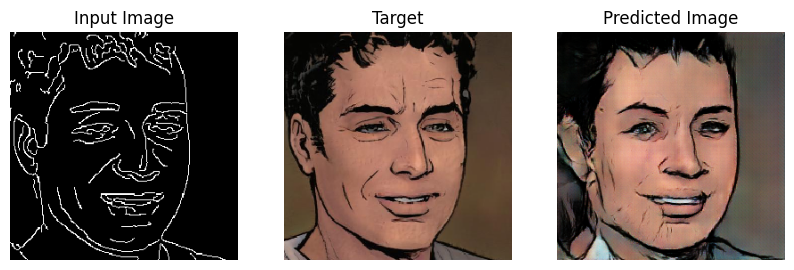

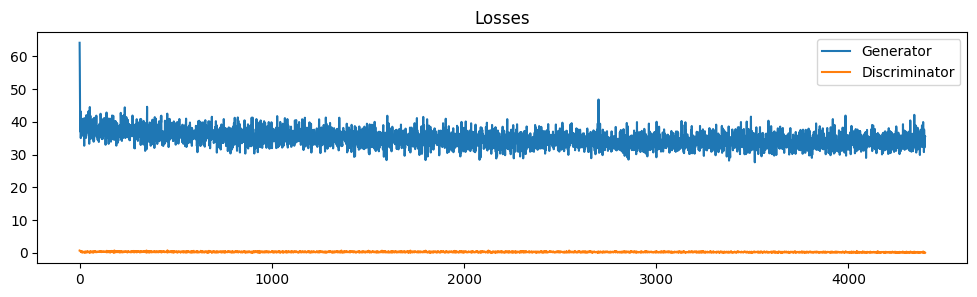

  Iter 44100 (i 8100/9000) [G loss: 19.4449 | D loss: 0.2466]
  Iter 44200 (i 8200/9000) [G loss: 34.7961 | D loss: 0.1355]
  Iter 44300 (i 8300/9000) [G loss: 39.5235 | D loss: 0.0214]
  Iter 44400 (i 8400/9000) [G loss: 32.1899 | D loss: 0.0648]
  Iter 44500 (i 8500/9000) [G loss: 35.6637 | D loss: 0.2458]
  Iter 44600 (i 8600/9000) [G loss: 37.2993 | D loss: 0.9125]
  Iter 44700 (i 8700/9000) [G loss: 60.0879 | D loss: 0.0181]
  Iter 44800 (i 8800/9000) [G loss: 29.3566 | D loss: 0.0598]
  Iter 44900 (i 8900/9000) [G loss: 34.8727 | D loss: 0.1096]
  Iter 45000 (i 9000/9000) [G loss: 28.1026 | D loss: 0.0356]

  Iter 45000 | Saving model to models/pix2pix_face2comics



In [ ]:
EPOCHS = 5 # change accordingly (if the dataset is big, you don't need as many)

# All stats according to iters, rather than batch or epoch
AVG_EVERY = 10      # collect batch losses for plotting
PRINT_EVERY = 100   # print stats
GEN_EVERY = 2000    # generate imgs
PLOT_EVERY = 2000   # plot losses (skips iter 0 unless it is 1: 'every iter')
                    # ↓ save model (skips iter 0 unless it is 1: 'every iter')
SAVE_EVERY = iters + EPOCHS * tot * BATCH_SIZE # save at the very end!

for epoch in range(EPOCHS):

    print()
    print(f"Epoch {epoch+1:>{len(str(EPOCHS))}}/{EPOCHS} | Iter: {iters}")

    batch_d_losses = []
    batch_g_losses = []

    for i, (input_image, target_image) in enumerate(train_dataloader):

        G_loss, D_loss = train_step(input_image, target_image)
        g_l, d_l = G_loss.item(), D_loss.item()
        batch_g_losses.append(g_l)
        batch_d_losses.append(d_l)

        if (iters + 1) % PRINT_EVERY == 0:
            print(
                f"  Iter {iters+1} (i {i+1:>{len(str(tot))}}/{tot}) "
                + f"[G loss: {g_l:.4f} | D loss: {d_l:.4f}]"
            )

        if iters % AVG_EVERY == 0:
            # print("Averaging losses")
            # average values collected until now, reset temporary lists
            g_losses.append(np.mean(batch_g_losses))
            d_losses.append(np.mean(batch_d_losses))
            batch_d_losses = []
            batch_g_losses = []

        if (iters + 1) % GEN_EVERY == 0:
            generate_images(
                G, input_image, target_image,
                fname_no_ext=PIX2PIX_GEN_DIR / f"generated_image.iter_{iters+1:04d}"
            )

        if (iters > 0 or PLOT_EVERY == 1) and (iters + 1) % PLOT_EVERY == 0:
            # print()
            # print(f"  Iter {iters + 1} | Plotting")
            # print()
            plot(d_losses, g_losses)

        if (iters > 0 or SAVE_EVERY == 1) and (iters + 1) % SAVE_EVERY == 0:
            print()
            print(f"  Iter {iters+1} | Saving model to {PIX2PIX_DIR}")
            print()
            G_scripted = torch.jit.script(G)
            G_scripted.save(PIX2PIX_DIR / f"pix2pix_{MODEL_NAME}.iter_{iters+1:04d}_scripted.pt")
            # The following saves only model parameters
            torch.save(G.state_dict(), PIX2PIX_DIR / f"pix2pix_{MODEL_NAME}.iter_{iters+1:04d}.pt")

        iters += 1 # technically should be BATCH_SIZE, but oh well

### Download your data

In [ ]:
!zip -r generated.zip generated
!zip -r models.zip models

  adding: generated/ (stored 0%)
  adding: generated/pix2pix_face2comics_images/ (stored 0%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_12000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_40000_0000.png (deflated 4%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_44000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_22000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_6000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_32000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_20000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_26000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2comics_images/generated_image.iter_28000_0000.png (deflated 3%)
  adding: generated/pix2pix_face2co

```bash
# -r for 'recursive', required for directories
!zip -r generated.zip generated
!zip -r models.zip models
# then use the left-hand side bar to download manually.
```

(The process is similar for `datasets`, if you want to save that.)

If you want to save things to your drive, you, can then move those to the destination of your choice (provided you mounted your drive in the first place):

```bash
!cp -r models/* !mv drive/MyDrive/IS53055B-DMLCP/DMLCP/python/models
```

In [ ]:
!cp -r generated/* !mv /content/drive/MyDrive/New_DAMLCP/DMLCP/python/generated/

cp: cannot stat '!mv': No such file or directory
